<a href="https://colab.research.google.com/github/arashHarirpoosh/AIMedicInternship/blob/main/ClassificationOnDermaMNIST.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import Required library's

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten, BatchNormalization
from tensorflow.keras.layers import GlobalAveragePooling2D, GlobalMaxPooling2D
from tensorflow.keras.layers import Conv2D, MaxPooling2D, concatenate, add
from tensorflow.keras.layers import Activation
from tensorflow.keras import layers
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from matplotlib import pyplot as plt
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline
from imblearn.under_sampling import RandomUnderSampler
from sklearn import metrics
import numpy as np
import datetime
# Load the TensorBoard notebook extension.
%load_ext tensorboard

print('colab tensorflow version:', tf.__version__)

/usr/local/lib/python3.7/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)


colab tensorflow version: 2.5.0


# Load The Data And Split Train Data To Validation And Train

Download the Derma Mnist dataset

In [ ]:
!wget -O Data.npz https://zenodo.org/record/4269852/files/dermamnist.npz?download=1


--2021-08-16 20:55:33--  https://zenodo.org/record/4269852/files/dermamnist.npz?download=1
Resolving zenodo.org (zenodo.org)... 137.138.76.77
Connecting to zenodo.org (zenodo.org)|137.138.76.77|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 19725078 (19M) [application/octet-stream]
Saving to: ‘Data.npz’

Data.npz            100%[===================>]  18.81M  2.08MB/s    in 17s     

2021-08-16 20:55:52 (1.08 MB/s) - ‘Data.npz’ saved [19725078/19725078]



Load The DermaMnist Data Set

In [ ]:
data = np.load('Data.npz')
print(data.files)
x_train, y_train = data['train_images'], data['train_labels']
x_val, y_val = data['val_images'], data['val_labels']
x_test, y_test = data['test_images'], data['test_labels']


['train_images', 'val_images', 'test_images', 'train_labels', 'val_labels', 'test_labels']


# Preparing The Data By Adding Augmented Data To The Data Set, Normalizing The Features And One Hot Encoding The Labels 

Add augmented data's to the train set

In [ ]:
# x_train = np.concatenate((x_train, np.array(augmented_data_flip), np.array(augmented_data_center)), axis=0)
# y_train = np.concatenate((y_train, np.array(augmented_data_label_flip), np.array(augmented_data_label_center)), axis=0)

Check the labels distribution

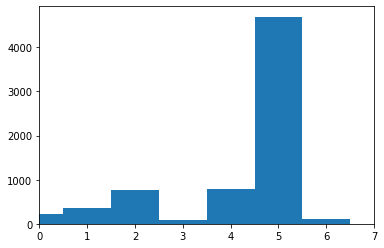

In [ ]:
hist, bin_edges = np.histogram(y_train, bins=range(8))
plt.bar(bin_edges[:-1], hist, width = 1)
plt.xlim(min(bin_edges), max(bin_edges))
plt.show()   

Normalizing Features

In [ ]:
x_train, x_val, x_test = x_train / 255.0, x_val / 255.0, x_test / 255.0

One Hot Encoding train and test labels

In [ ]:
y_train = to_categorical(y_train)
y_test = to_categorical(y_test)
y_val = to_categorical(y_val)

# Modify EarlyStopping Callback And Define Some Functions For Plotting And Evaluating The Model

Modify early stopping callback

In [ ]:

class EarlyStoppingCallback(keras.callbacks.Callback):
  def __init__(self, patience=0, monitor='val_loss'):
    super(EarlyStoppingCallback, self).__init__()
    self.patience = patience
    self.monitor = monitor

  def on_train_begin(self, logs=None):
    if self.monitor in ['loss', 'val_loss']:
      self.best = np.Inf
    else:
      self.best = 0
    self.wait = 0
    self.stopped_epoch = 0
  
  def on_epoch_end(self, epoch,logs=None):
    current_monitor=logs.get(self.monitor)
    bool1 = self.monitor in ['loss', 'val_loss'] and np.less(current_monitor,
                                                             self.best)
    bool2 = self.monitor in ['accuracy', 'val_accuracy'] and np.less(self.best,
                                                                     current_monitor)
    if bool1 or bool2:
      self.best = current_monitor
      self.wait = 0
      self.best_weights = self.model.get_weights()
    else:
      self.wait += 1
      print("\nwait mode, step: %d"% self.wait)
      if self.wait >= self.patience:
        self.stopped_epoch = epoch
        self.model.stop_training = True
        self.model.set_weights(self.best_weights)
  
  def on_train_end(self, logs=None):
    if self.stopped_epoch > 0:
      print("epoch: %d : early stopping."% self.stopped_epoch)

Plot metric value

In [ ]:
def plotMetric(history, firstMetric, firstLabel, secondMetric, secondLabel, title, ylabel):
  plt.plot(history.history[firstMetric], label=firstLabel)
  plt.plot(history.history[secondMetric], label=secondLabel)
  plt.title(title)
  plt.ylabel(ylabel)
  plt.xlabel('epoch')
  plt.legend(loc='upper left')
  plt.show()

Plot accuracy and loss

In [ ]:
def plotAccuracyLoss(history, firstMetric):
  plotMetric(history, 'accuracy', 'train_acc', 'val_accuracy', 'val_acc', 'model accuracy', 'accuracy')
  print()
  plotMetric(history, 'loss', 'tarin_loss', 'val_loss', 'val_loss', 'model Loss', 'loss')

Evaluating the model by calculating the confusion matrix and report other metrics

In [ ]:
all_accuracy = {}
def calculateAccuracyModel(model, model_name):
  # evaluate the keras model
  _, accuracy, auc = model.evaluate(x_train, y_train, batch_size=100)
  print('Train Accuracy: %.2f' % (accuracy*100))
  # all_accuracy[model_name] = {'Train':
  #                             {
  #                                 'AUC': auc * 100,
  #                                 'Weighted Accuracy': accuracy * 100
  #                              }
  #                             }
  all_accuracy[model_name] = {
                                'Train_AUC': auc * 100,
                                'Train_Weighted Accuracy': accuracy * 100
                              }
  print()
  # evaluate the keras model
  _, accuracy, auc  = model.evaluate(x_test, y_test, batch_size=100)
  print('Test Accuracy: %.2f' % (accuracy*100))
  # all_accuracy[model_name]['Test'] = {
  #                                 'AUC': auc * 100,
  #                                 'Weighted Accuracy': accuracy * 100
  #                                     }
  all_accuracy[model_name]['Test_AUC'] = auc * 100
  all_accuracy[model_name]['Test_Weighted Accuracy'] = accuracy * 100
                              

def reportPerformance(model, x, y):
  y_pred = model.predict(x)
  print('Confusion Matrix')
  print()
  conf_matrix = metrics.confusion_matrix(y.argmax(axis=1), y_pred.argmax(axis=1))
  disp = metrics.ConfusionMatrixDisplay(confusion_matrix=conf_matrix,
                                        display_labels=range(0, 10))
  fig, ax = plt.subplots(figsize=(10,10))
  disp.plot(ax=ax, cmap=plt.cm.Blues)
  plt.show()
  print()
  print(conf_matrix)
  print()
  print('Classification Report')
  print(metrics.classification_report(y.argmax(axis=1), y_pred.argmax(axis=1)))

# CNN Different Blocks

## Inception Module Block

Inception V3

In [ ]:
# function for creating a projected inception module
def inception_module3(layer_in, f1, f2_in, f2_out, f3_in,
                      f3_out, f4_out, activation_function='relu'):
  # 1x1 conv
  conv1 = Conv2D(f1, (1,1), padding='same', activation=activation_function)(layer_in)
  # 3x3 conv
  conv3 = Conv2D(f2_in, (1,1), padding='same', activation=activation_function)(layer_in)
  conv3_1 = Conv2D(f2_out, (1,3), padding='same', activation=activation_function)(conv3)
  conv3_2 = Conv2D(f2_out, (3,1), padding='same', activation=activation_function)(conv3_1)
  # 5x5 conv
  conv5 = Conv2D(f3_in, (1,1), padding='same', activation=activation_function)(layer_in)
  conv3_1_1 = Conv2D(f3_out, (1,3), padding='same', activation=activation_function)(conv5)
  conv3_1_2 = Conv2D(f3_out, (3,1), padding='same', activation=activation_function)(conv3_1_1)
  conv3_2_1 = Conv2D(f3_out, (1,3), padding='same', activation=activation_function)(conv3_1_2)
  conv3_2_2 = Conv2D(f3_out, (3,1), padding='same', activation=activation_function)(conv3_2_1)
  # 3x3 max pooling
  pool = MaxPooling2D((3,3), strides=(1,1), padding='same')(layer_in)
  pool = Conv2D(f4_out, (1,1), padding='same', activation=activation_function)(pool)
  # concatenate filters, assumes filters/channels last
  layer_out = concatenate([conv1, conv3_2, conv3_2_2, pool], axis=-1)
  return layer_out# function for creating a projected inception module


## ResNet Blocks

In [ ]:
# function for creating an identity or projection residual module
def residual_module(layer_in, n_filters, kernel_size=3):
  merge_input = layer_in
  # check if the number of filters needs to be increase, assumes channels last format
  if layer_in.shape[-1] != n_filters:
    merge_input = Conv2D(n_filters, (1,1), padding='same', activation='relu', kernel_initializer='he_normal')(layer_in)
  # conv1
  conv1 = Conv2D(n_filters, (kernel_size,1), padding='same', activation='relu', kernel_initializer='he_normal')(layer_in)
  conv1 = Conv2D(n_filters, (1, kernel_size), padding='same', activation='relu', kernel_initializer='he_normal')(conv1)
  # conv2
  conv2 = Conv2D(n_filters, (kernel_size,1), padding='same', activation='linear', kernel_initializer='he_normal')(conv1)
  conv2 = Conv2D(n_filters, (1, kernel_size), padding='same', activation='linear', kernel_initializer='he_normal')(conv2)
  # add filters, assumes filters/channels last
  layer_out = add([conv2, merge_input])
  # activation function
  layer_out = Activation('relu')(layer_out)
  return layer_out
 


# Design CNN Models Before UpSampeling

## Design CNN Models Based On Inception Module

CNN model with inception module 3

Model: "cifar10_cnn_model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 28, 28, 3)]  0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 22, 22, 32)   4736        input_1[0][0]                    
__________________________________________________________________________________________________
max_pooling2d (MaxPooling2D)    (None, 10, 10, 32)   0           conv2d[0][0]                     
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 10, 10, 32)   128         max_pooling2d[0][0]              
__________________________________________________________________________________

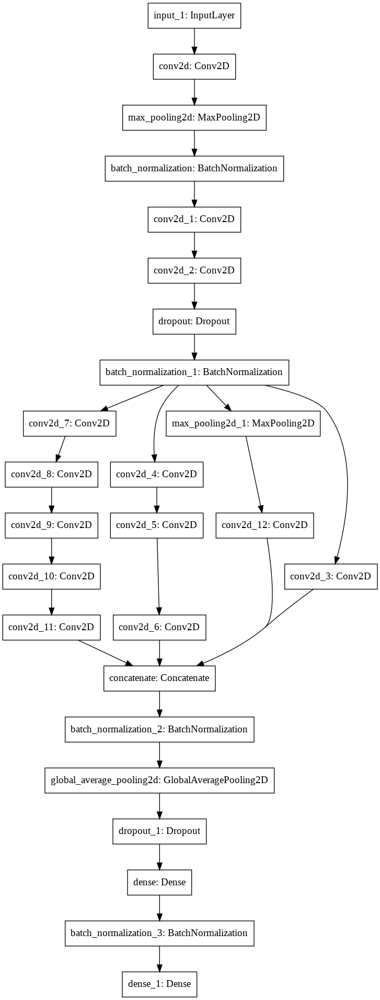

In [ ]:

inputs = keras.Input(shape=x_train.shape[1:])
conv1 = Conv2D(32, kernel_size=7, activation='relu')(inputs)
pool1 = MaxPooling2D(pool_size=3, strides=2)(conv1)
b1 = BatchNormalization() (pool1)
conv2 = Conv2D(64, kernel_size=(1, 3), activation='relu')(b1)
conv2 = Conv2D(64, kernel_size=(3, 1), activation='relu')(conv2)
d0 = Dropout(0.2)(conv2)
b2 = BatchNormalization() (d0)

layer = inception_module3(b2, 32, 48, 64, 8, 16, 16)
b3 = BatchNormalization() (layer)
globalPooling1 = GlobalAveragePooling2D()(b3)
d1 = Dropout(0.4)(globalPooling1)
fc1 = Dense(32, activation='linear')(d1)
b4 = BatchNormalization() (fc1)
outputs = Dense(7, activation='softmax')(b4)
model = keras.Model(inputs=inputs, outputs=outputs, name="cifar10_cnn_model")

model.summary()
keras.utils.plot_model(model, "my_first_cnn_model_with_shape_info.png")

Compile and train first cnn model

In [ ]:

model.compile(
    loss=keras.losses.CategoricalCrossentropy(),
    # optimizer=keras.optimizers.SGD(learning_rate=0.1, nesterov=True),
    optimizer=keras.optimizers.Adam(),
    # optimizer=keras.optimizers.SGD(lr=0.001, momentum=0.9),
    # optimizer=keras.optimizers.RMSprop(),
    metrics=[
             'AUC', 
              tf.keras.metrics.CategoricalAccuracy()
             ],
              )

# fit the keras model on the dataset
my_callbacks = [
    EarlyStoppingCallback(25, monitor='val_loss'),
    keras.callbacks.ReduceLROnPlateau(monitor='val_loss', mode='auto',
                                      factor=0.9, patience=5, min_lr=1e-5)
]
history = model.fit(x_train, y_train, epochs=100, callbacks=my_callbacks,
                    batch_size=64,  validation_data=(x_val, y_val), shuffle=True)

Epoch 1/100
110/110 [==============================] - 35s 18ms/step - loss: 1.5384 - auc: 0.7925 - categorical_accuracy: 0.5338 - val_loss: 1.8000 - val_auc: 0.7000 - val_categorical_accuracy: 0.3968
Epoch 2/100
110/110 [==============================] - 1s 10ms/step - loss: 1.0773 - auc: 0.9073 - categorical_accuracy: 0.6787 - val_loss: 1.3524 - val_auc: 0.8177 - val_categorical_accuracy: 0.6261
Epoch 3/100
110/110 [==============================] - 1s 10ms/step - loss: 0.9120 - auc: 0.9329 - categorical_accuracy: 0.6953 - val_loss: 1.1338 - val_auc: 0.8945 - val_categorical_accuracy: 0.6700
Epoch 4/100
110/110 [==============================] - 1s 10ms/step - loss: 0.8339 - auc: 0.9429 - categorical_accuracy: 0.7033 - val_loss: 0.9768 - val_auc: 0.9287 - val_categorical_accuracy: 0.6740
Epoch 5/100
110/110 [==============================] - 1s 10ms/step - loss: 0.7853 - auc: 0.9488 - categorical_accuracy: 0.7131 - val_loss: 1.5924 - val_auc: 0.8685 - val_categorical_accuracy: 0.6690

Plot  accuracy and loss in epochs

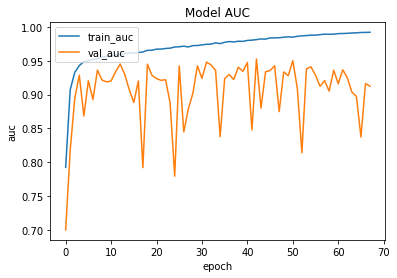

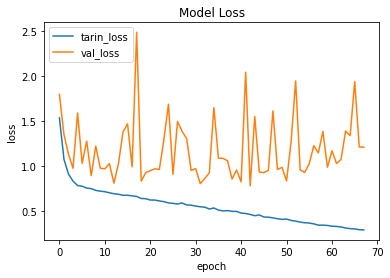

In [ ]:
  plotMetric(history, 'auc', 'train_auc', 'val_auc', 'val_auc', 'Model AUC', 'auc')
  print()
  plotMetric(history, 'loss', 'tarin_loss', 'val_loss', 'val_loss', 'Model Loss', 'loss')

Calculate the accuracy of model in train and test 

In [ ]:
calculateAccuracyModel(model, 'CNN_Inception_BeforeBalancingDataset')

71/71 [==============================] - 1s 6ms/step - loss: 0.4587 - auc: 0.9819 - categorical_accuracy: 0.8335
Train Accuracy: 98.19

21/21 [==============================] - 0s 9ms/step - loss: 0.7660 - auc: 0.9529 - categorical_accuracy: 0.7401
Test Accuracy: 95.29


Evaluate the model performance

Model evaluation on train dataset
Confusion Matrix



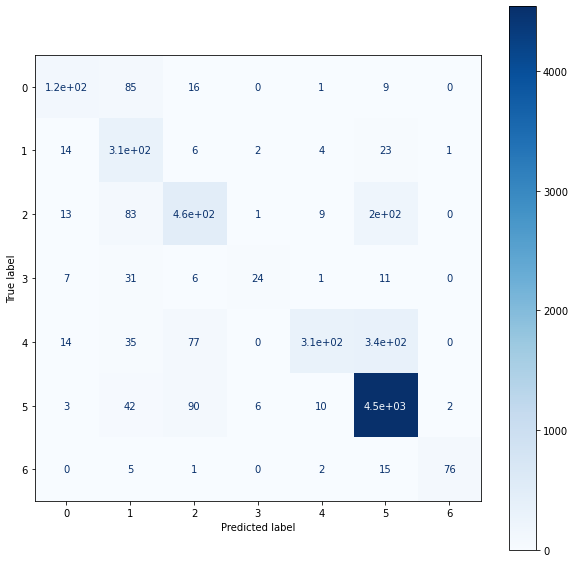


[[ 117   85   16    0    1    9    0]
 [  14  309    6    2    4   23    1]
 [  13   83  465    1    9  198    0]
 [   7   31    6   24    1   11    0]
 [  14   35   77    0  309  344    0]
 [   3   42   90    6   10 4540    2]
 [   0    5    1    0    2   15   76]]

Classification Report
              precision    recall  f1-score   support

           0       0.70      0.51      0.59       228
           1       0.52      0.86      0.65       359
           2       0.70      0.60      0.65       769
           3       0.73      0.30      0.42        80
           4       0.92      0.40      0.55       779
           5       0.88      0.97      0.92      4693
           6       0.96      0.77      0.85        99

    accuracy                           0.83      7007
   macro avg       0.77      0.63      0.66      7007
weighted avg       0.84      0.83      0.82      7007


Model evaluation on test dataset
Confusion Matrix



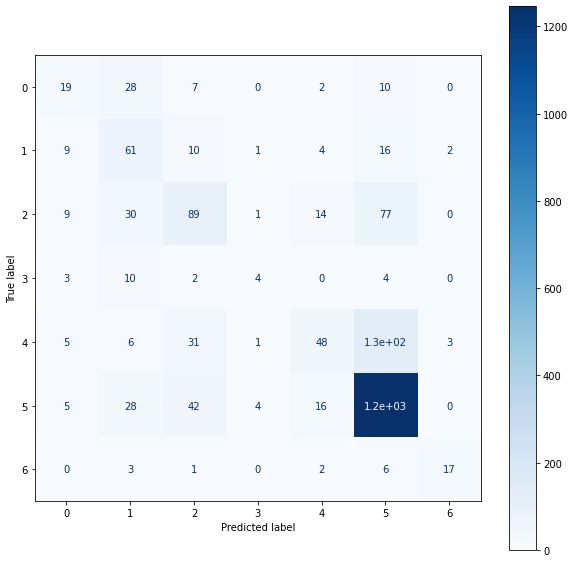


[[  19   28    7    0    2   10    0]
 [   9   61   10    1    4   16    2]
 [   9   30   89    1   14   77    0]
 [   3   10    2    4    0    4    0]
 [   5    6   31    1   48  129    3]
 [   5   28   42    4   16 1246    0]
 [   0    3    1    0    2    6   17]]

Classification Report
              precision    recall  f1-score   support

           0       0.38      0.29      0.33        66
           1       0.37      0.59      0.45       103
           2       0.49      0.40      0.44       220
           3       0.36      0.17      0.24        23
           4       0.56      0.22      0.31       223
           5       0.84      0.93      0.88      1341
           6       0.77      0.59      0.67        29

    accuracy                           0.74      2005
   macro avg       0.54      0.46      0.47      2005
weighted avg       0.72      0.74      0.72      2005



In [ ]:
print('Model evaluation on train dataset')
reportPerformance(model, x_train, y_train)
print()
print('Model evaluation on test dataset')
reportPerformance(model, x_test, y_test)

## Try Different Parameters For Inception Model

### Changing The Activation Function

#### Set The Activation Function Of Inception Module To Sigmoid

CNN model with inception module 3

Model: "cifar10_cnn_model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_6 (InputLayer)            [(None, 28, 28, 3)]  0                                            
__________________________________________________________________________________________________
conv2d_67 (Conv2D)              (None, 22, 22, 32)   4736        input_6[0][0]                    
__________________________________________________________________________________________________
max_pooling2d_8 (MaxPooling2D)  (None, 10, 10, 32)   0           conv2d_67[0][0]                  
__________________________________________________________________________________________________
batch_normalization_20 (BatchNo (None, 10, 10, 32)   128         max_pooling2d_8[0][0]            
__________________________________________________________________________________

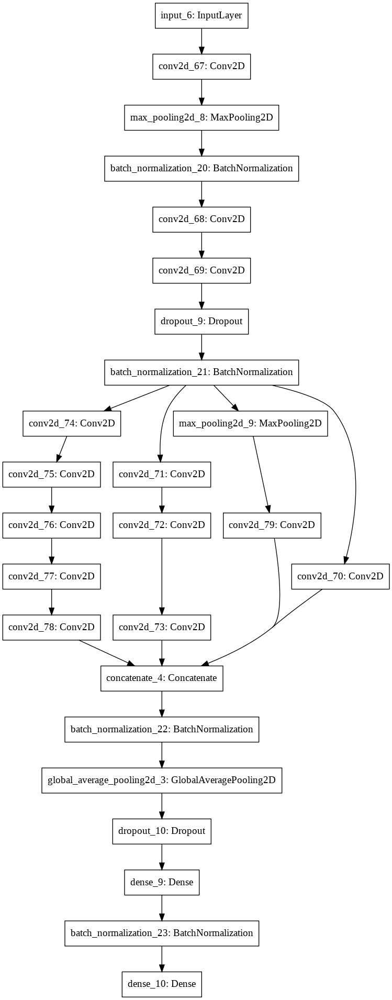

In [ ]:
if model:
  del model

inputs = keras.Input(shape=x_train.shape[1:])
conv1 = Conv2D(32, kernel_size=7, activation='relu')(inputs)
pool1 = MaxPooling2D(pool_size=3, strides=2)(conv1)
b1 = BatchNormalization() (pool1)
conv2 = Conv2D(64, kernel_size=(1, 3), activation='relu')(b1)
conv2 = Conv2D(64, kernel_size=(3, 1), activation='relu')(conv2)
d0 = Dropout(0.2)(conv2)
b2 = BatchNormalization() (d0)

layer = inception_module3(b2, 32, 48, 64, 8, 16, 16, 'sigmoid')
b3 = BatchNormalization() (layer)
globalPooling1 = GlobalAveragePooling2D()(b3)
d1 = Dropout(0.4)(globalPooling1)
fc1 = Dense(32, activation='linear')(d1)
b4 = BatchNormalization() (fc1)
outputs = Dense(7, activation='softmax')(b4)
model = keras.Model(inputs=inputs, outputs=outputs, name="cifar10_cnn_model")

model.summary()
keras.utils.plot_model(model, "my_first_cnn_model_with_shape_info.png")

Compile and train first cnn model

In [ ]:

model.compile(
    loss=keras.losses.CategoricalCrossentropy(),
    # optimizer=keras.optimizers.SGD(learning_rate=0.1, nesterov=True),
    optimizer=keras.optimizers.Adam(),
    # optimizer=keras.optimizers.SGD(lr=0.001, momentum=0.9),
    # optimizer=keras.optimizers.RMSprop(),
    metrics=[
             'AUC', 
              tf.keras.metrics.CategoricalAccuracy()
             ],
              )

# fit the keras model on the dataset
my_callbacks = [
    # EarlyStoppingCallback(5, monitor='val_loss'),
    keras.callbacks.ReduceLROnPlateau(monitor='val_loss', mode='auto',
                                      factor=0.9, patience=5, min_lr=1e-5)
]
history = model.fit(x_train, y_train, epochs=10, callbacks=my_callbacks,
                    batch_size=64,  validation_data=(x_val, y_val), shuffle=True)

Epoch 1/10
110/110 [==============================] - 3s 13ms/step - loss: 1.5455 - auc: 0.7839 - categorical_accuracy: 0.5255 - val_loss: 1.2542 - val_auc: 0.8950 - val_categorical_accuracy: 0.6690
Epoch 2/10
110/110 [==============================] - 1s 9ms/step - loss: 1.0658 - auc: 0.9089 - categorical_accuracy: 0.6646 - val_loss: 1.2052 - val_auc: 0.9023 - val_categorical_accuracy: 0.6690
Epoch 3/10
110/110 [==============================] - 1s 9ms/step - loss: 0.8722 - auc: 0.9384 - categorical_accuracy: 0.7036 - val_loss: 1.1349 - val_auc: 0.8754 - val_categorical_accuracy: 0.6690
Epoch 4/10
110/110 [==============================] - 1s 9ms/step - loss: 0.8183 - auc: 0.9450 - categorical_accuracy: 0.7067 - val_loss: 1.3537 - val_auc: 0.8754 - val_categorical_accuracy: 0.6690
Epoch 5/10
110/110 [==============================] - 1s 9ms/step - loss: 0.7886 - auc: 0.9487 - categorical_accuracy: 0.7149 - val_loss: 1.3333 - val_auc: 0.8985 - val_categorical_accuracy: 0.6690
Epoch 6/1

Plot  accuracy and loss in epochs

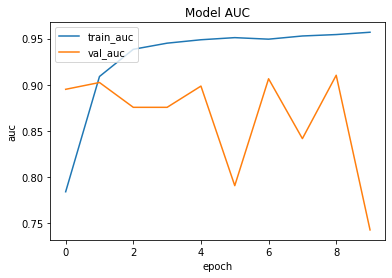

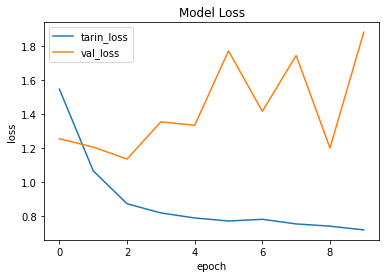

In [ ]:
  plotMetric(history, 'auc', 'train_auc', 'val_auc', 'val_auc', 'Model AUC', 'auc')
  print()
  plotMetric(history, 'loss', 'tarin_loss', 'val_loss', 'val_loss', 'Model Loss', 'loss')

Calculate the accuracy of model in train and test 

In [ ]:
calculateAccuracyModel(model, 'CNN_Inception_BeforeBalancingDataset_Sigmoid')

71/71 [==============================] - 0s 5ms/step - loss: 1.8095 - auc: 0.7555 - categorical_accuracy: 0.3668
Train Accuracy: 75.55

21/21 [==============================] - 0s 5ms/step - loss: 1.8346 - auc: 0.7533 - categorical_accuracy: 0.3661
Test Accuracy: 75.33


Evaluate the model performance

Model evaluation on train dataset
Confusion Matrix



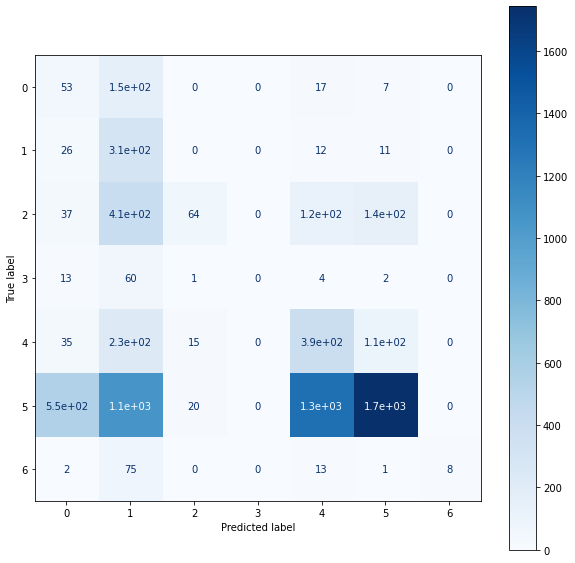


[[  53  151    0    0   17    7    0]
 [  26  310    0    0   12   11    0]
 [  37  406   64    0  121  141    0]
 [  13   60    1    0    4    2    0]
 [  35  230   15    0  391  108    0]
 [ 554 1057   20    0 1318 1744    0]
 [   2   75    0    0   13    1    8]]

Classification Report
              precision    recall  f1-score   support

           0       0.07      0.23      0.11       228
           1       0.14      0.86      0.23       359
           2       0.64      0.08      0.15       769
           3       0.00      0.00      0.00        80
           4       0.21      0.50      0.29       779
           5       0.87      0.37      0.52      4693
           6       1.00      0.08      0.15        99

    accuracy                           0.37      7007
   macro avg       0.42      0.30      0.21      7007
weighted avg       0.70      0.37      0.41      7007


Model evaluation on test dataset
Confusion Matrix



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


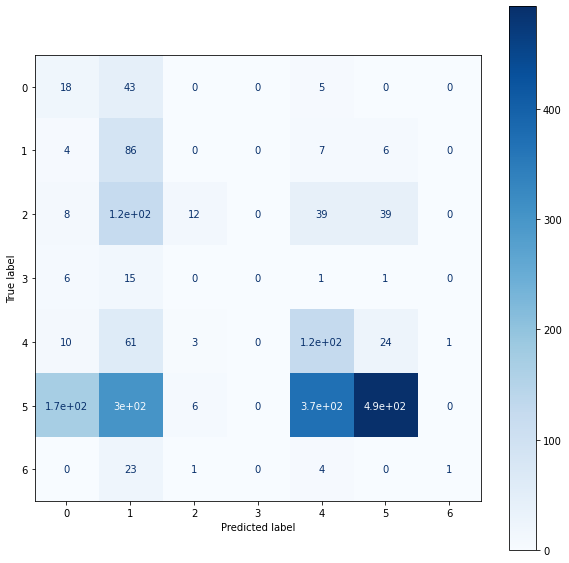


[[ 18  43   0   0   5   0   0]
 [  4  86   0   0   7   6   0]
 [  8 122  12   0  39  39   0]
 [  6  15   0   0   1   1   0]
 [ 10  61   3   0 124  24   1]
 [170 302   6   0 370 493   0]
 [  0  23   1   0   4   0   1]]

Classification Report
              precision    recall  f1-score   support

           0       0.08      0.27      0.13        66
           1       0.13      0.83      0.23       103
           2       0.55      0.05      0.10       220
           3       0.00      0.00      0.00        23
           4       0.23      0.56      0.32       223
           5       0.88      0.37      0.52      1341
           6       0.50      0.03      0.06        29

    accuracy                           0.37      2005
   macro avg       0.34      0.30      0.19      2005
weighted avg       0.69      0.37      0.41      2005



In [ ]:
print('Model evaluation on train dataset')
reportPerformance(model, x_train, y_train)
print()
print('Model evaluation on test dataset')
reportPerformance(model, x_test, y_test)

#### Set The Activation Function Of Inception Module To Tanh

CNN model with inception module 3

Model: "cifar10_cnn_model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_7 (InputLayer)            [(None, 28, 28, 3)]  0                                            
__________________________________________________________________________________________________
conv2d_80 (Conv2D)              (None, 22, 22, 32)   4736        input_7[0][0]                    
__________________________________________________________________________________________________
max_pooling2d_10 (MaxPooling2D) (None, 10, 10, 32)   0           conv2d_80[0][0]                  
__________________________________________________________________________________________________
batch_normalization_24 (BatchNo (None, 10, 10, 32)   128         max_pooling2d_10[0][0]           
__________________________________________________________________________________

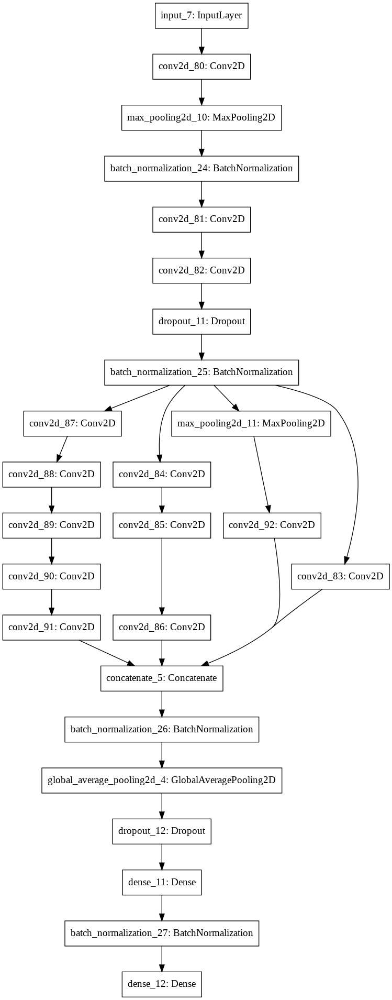

In [ ]:
if model:
  del model

inputs = keras.Input(shape=x_train.shape[1:])
conv1 = Conv2D(32, kernel_size=7, activation='relu')(inputs)
pool1 = MaxPooling2D(pool_size=3, strides=2)(conv1)
b1 = BatchNormalization() (pool1)
conv2 = Conv2D(64, kernel_size=(1, 3), activation='relu')(b1)
conv2 = Conv2D(64, kernel_size=(3, 1), activation='relu')(conv2)
d0 = Dropout(0.2)(conv2)
b2 = BatchNormalization() (d0)

layer = inception_module3(b2, 32, 48, 64, 8, 16, 16, 'tanh')
b3 = BatchNormalization() (layer)
globalPooling1 = GlobalAveragePooling2D()(b3)
d1 = Dropout(0.4)(globalPooling1)
fc1 = Dense(32, activation='linear')(d1)
b4 = BatchNormalization() (fc1)
outputs = Dense(7, activation='softmax')(b4)
model = keras.Model(inputs=inputs, outputs=outputs, name="cifar10_cnn_model")

model.summary()
keras.utils.plot_model(model, "my_first_cnn_model_with_shape_info.png")

Compile and train first cnn model

In [ ]:

model.compile(
    loss=keras.losses.CategoricalCrossentropy(),
    # optimizer=keras.optimizers.SGD(learning_rate=0.1, nesterov=True),
    optimizer=keras.optimizers.Adam(),
    # optimizer=keras.optimizers.SGD(lr=0.001, momentum=0.9),
    # optimizer=keras.optimizers.RMSprop(),
    metrics=[
             'AUC', 
              tf.keras.metrics.CategoricalAccuracy()
             ],
              )

# fit the keras model on the dataset
my_callbacks = [
    # EarlyStoppingCallback(5, monitor='val_loss'),
    keras.callbacks.ReduceLROnPlateau(monitor='val_loss', mode='auto',
                                      factor=0.9, patience=5, min_lr=1e-5)
]
history = model.fit(x_train, y_train, epochs=10, callbacks=my_callbacks,
                    batch_size=64,  validation_data=(x_val, y_val), shuffle=True)

Epoch 1/10
110/110 [==============================] - 3s 13ms/step - loss: 1.5098 - auc: 0.7951 - categorical_accuracy: 0.5409 - val_loss: 1.6535 - val_auc: 0.7296 - val_categorical_accuracy: 0.4796
Epoch 2/10
110/110 [==============================] - 1s 9ms/step - loss: 1.0634 - auc: 0.9072 - categorical_accuracy: 0.6679 - val_loss: 1.3681 - val_auc: 0.8158 - val_categorical_accuracy: 0.6540
Epoch 3/10
110/110 [==============================] - 1s 9ms/step - loss: 0.8679 - auc: 0.9391 - categorical_accuracy: 0.7083 - val_loss: 1.8646 - val_auc: 0.6714 - val_categorical_accuracy: 0.3729
Epoch 4/10
110/110 [==============================] - 1s 9ms/step - loss: 0.8092 - auc: 0.9461 - categorical_accuracy: 0.7111 - val_loss: 1.6785 - val_auc: 0.8714 - val_categorical_accuracy: 0.6700
Epoch 5/10
110/110 [==============================] - 1s 9ms/step - loss: 0.7927 - auc: 0.9480 - categorical_accuracy: 0.7129 - val_loss: 1.0496 - val_auc: 0.9173 - val_categorical_accuracy: 0.6830
Epoch 6/1

Plot  accuracy and loss in epochs

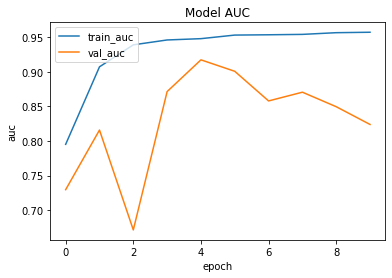

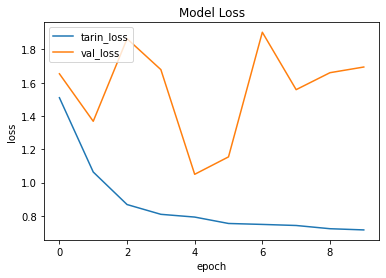

In [ ]:
  plotMetric(history, 'auc', 'train_auc', 'val_auc', 'val_auc', 'Model AUC', 'auc')
  print()
  plotMetric(history, 'loss', 'tarin_loss', 'val_loss', 'val_loss', 'Model Loss', 'loss')

Calculate the accuracy of model in train and test 

In [ ]:
calculateAccuracyModel(model, 'CNN_Inception_BeforeBalancingDataset_Tanh')

71/71 [==============================] - 0s 6ms/step - loss: 1.6558 - auc: 0.8291 - categorical_accuracy: 0.4377
Train Accuracy: 82.91

21/21 [==============================] - 0s 5ms/step - loss: 1.6602 - auc: 0.8298 - categorical_accuracy: 0.4359
Test Accuracy: 82.98


Evaluate the model performance

Model evaluation on train dataset
Confusion Matrix



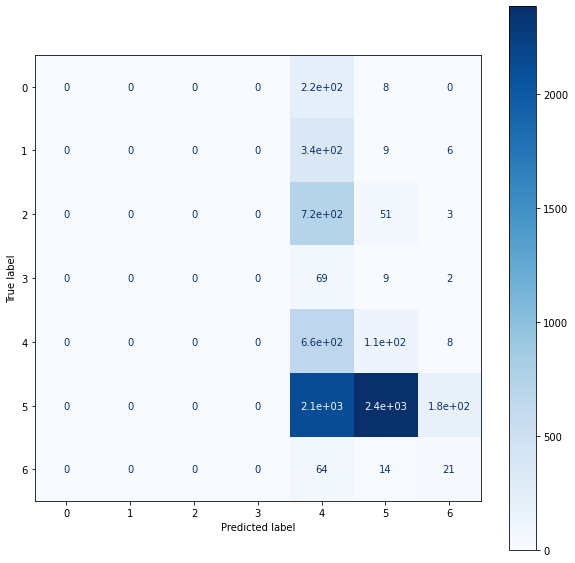


[[   0    0    0    0  220    8    0]
 [   0    0    0    0  344    9    6]
 [   0    0    0    0  715   51    3]
 [   0    0    0    0   69    9    2]
 [   0    0    0    0  659  112    8]
 [   0    0    0    0 2124 2387  182]
 [   0    0    0    0   64   14   21]]

Classification Report
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       228
           1       0.00      0.00      0.00       359
           2       0.00      0.00      0.00       769
           3       0.00      0.00      0.00        80
           4       0.16      0.85      0.26       779
           5       0.92      0.51      0.66      4693
           6       0.09      0.21      0.13        99

    accuracy                           0.44      7007
   macro avg       0.17      0.22      0.15      7007
weighted avg       0.64      0.44      0.47      7007


Model evaluation on test dataset


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Confusion Matrix



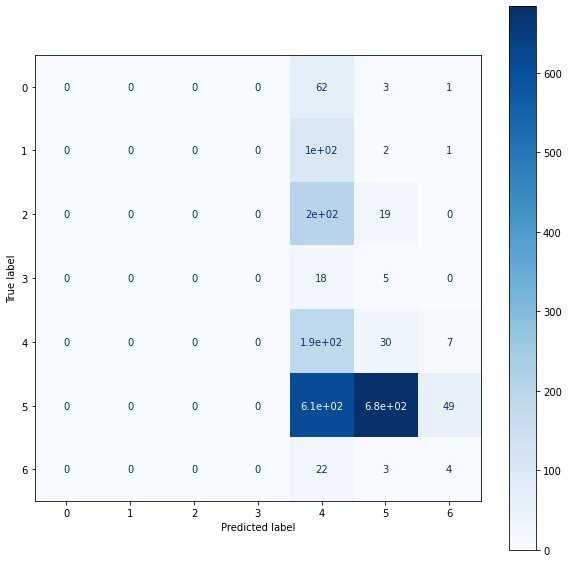


[[  0   0   0   0  62   3   1]
 [  0   0   0   0 100   2   1]
 [  0   0   0   0 201  19   0]
 [  0   0   0   0  18   5   0]
 [  0   0   0   0 186  30   7]
 [  0   0   0   0 608 684  49]
 [  0   0   0   0  22   3   4]]

Classification Report
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        66
           1       0.00      0.00      0.00       103
           2       0.00      0.00      0.00       220
           3       0.00      0.00      0.00        23
           4       0.16      0.83      0.26       223
           5       0.92      0.51      0.66      1341
           6       0.06      0.14      0.09        29

    accuracy                           0.44      2005
   macro avg       0.16      0.21      0.14      2005
weighted avg       0.63      0.44      0.47      2005



In [ ]:
print('Model evaluation on train dataset')
reportPerformance(model, x_train, y_train)
print()
print('Model evaluation on test dataset')
reportPerformance(model, x_test, y_test)

### Set The Global Pooling To The Global Max Pooling

CNN model with inception module 3

Model: "cifar10_cnn_model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_8 (InputLayer)            [(None, 28, 28, 3)]  0                                            
__________________________________________________________________________________________________
conv2d_93 (Conv2D)              (None, 22, 22, 32)   4736        input_8[0][0]                    
__________________________________________________________________________________________________
max_pooling2d_12 (MaxPooling2D) (None, 10, 10, 32)   0           conv2d_93[0][0]                  
__________________________________________________________________________________________________
batch_normalization_28 (BatchNo (None, 10, 10, 32)   128         max_pooling2d_12[0][0]           
__________________________________________________________________________________

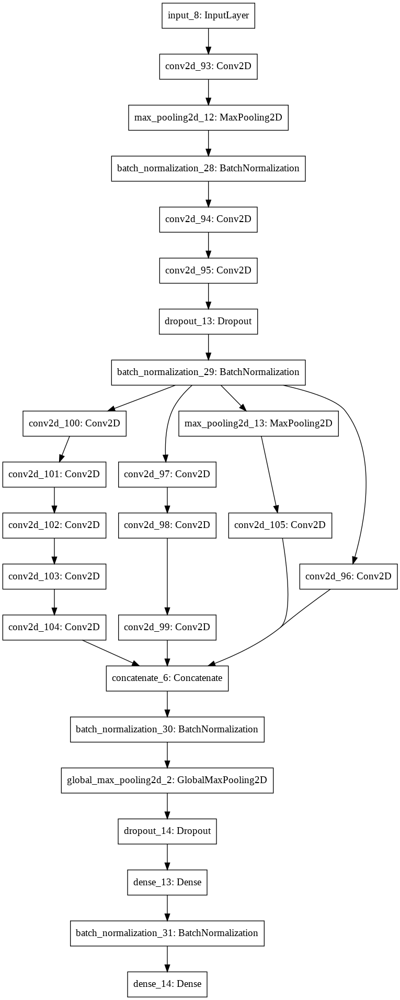

In [ ]:
if model:
  del model

inputs = keras.Input(shape=x_train.shape[1:])
conv1 = Conv2D(32, kernel_size=7, activation='relu')(inputs)
pool1 = MaxPooling2D(pool_size=3, strides=2)(conv1)
b1 = BatchNormalization() (pool1)
conv2 = Conv2D(64, kernel_size=(1, 3), activation='relu')(b1)
conv2 = Conv2D(64, kernel_size=(3, 1), activation='relu')(conv2)
d0 = Dropout(0.2)(conv2)
b2 = BatchNormalization() (d0)

layer = inception_module3(b2, 32, 48, 64, 8, 16, 16)
b3 = BatchNormalization() (layer)
globalPooling1 = GlobalMaxPooling2D()(b3)
d1 = Dropout(0.4)(globalPooling1)
fc1 = Dense(32, activation='linear')(d1)
b4 = BatchNormalization() (fc1)
outputs = Dense(7, activation='softmax')(b4)
model = keras.Model(inputs=inputs, outputs=outputs, name="cifar10_cnn_model")

model.summary()
keras.utils.plot_model(model, "my_first_cnn_model_with_shape_info.png")

Compile and train first cnn model

In [ ]:

model.compile(
    loss=keras.losses.CategoricalCrossentropy(),
    # optimizer=keras.optimizers.SGD(learning_rate=0.1, nesterov=True),
    optimizer=keras.optimizers.Adam(),
    # optimizer=keras.optimizers.SGD(lr=0.001, momentum=0.9),
    # optimizer=keras.optimizers.RMSprop(),
    metrics=[
             'AUC', 
              tf.keras.metrics.CategoricalAccuracy()
             ],
              )

# fit the keras model on the dataset
my_callbacks = [
    EarlyStoppingCallback(25, monitor='val_loss'),
    keras.callbacks.ReduceLROnPlateau(monitor='val_loss', mode='auto',
                                      factor=0.9, patience=5, min_lr=1e-5)
]
history = model.fit(x_train, y_train, epochs=100, callbacks=my_callbacks,
                    batch_size=64,  validation_data=(x_val, y_val), shuffle=True)

Epoch 1/100
110/110 [==============================] - 3s 13ms/step - loss: 1.6757 - auc: 0.7402 - categorical_accuracy: 0.4627 - val_loss: 2.5088 - val_auc: 0.2351 - val_categorical_accuracy: 0.1097
Epoch 2/100
110/110 [==============================] - 1s 10ms/step - loss: 1.1515 - auc: 0.8912 - categorical_accuracy: 0.6307 - val_loss: 1.9365 - val_auc: 0.6083 - val_categorical_accuracy: 0.1147
Epoch 3/100
110/110 [==============================] - 1s 10ms/step - loss: 0.9171 - auc: 0.9315 - categorical_accuracy: 0.6907 - val_loss: 1.0525 - val_auc: 0.9129 - val_categorical_accuracy: 0.6630
Epoch 4/100
110/110 [==============================] - 1s 10ms/step - loss: 0.8485 - auc: 0.9408 - categorical_accuracy: 0.6949 - val_loss: 0.9938 - val_auc: 0.9213 - val_categorical_accuracy: 0.6321
Epoch 5/100
110/110 [==============================] - 1s 10ms/step - loss: 0.8065 - auc: 0.9461 - categorical_accuracy: 0.7049 - val_loss: 1.1562 - val_auc: 0.9121 - val_categorical_accuracy: 0.6690


Plot  accuracy and loss in epochs

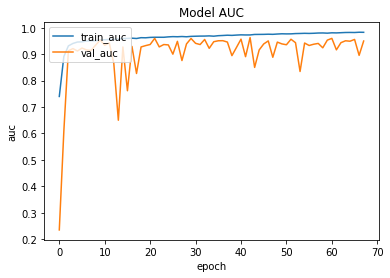

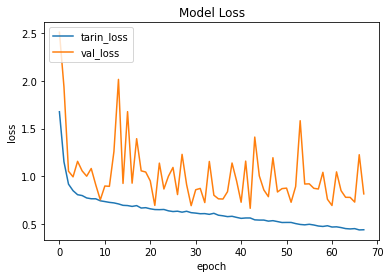

In [ ]:
  plotMetric(history, 'auc', 'train_auc', 'val_auc', 'val_auc', 'Model AUC', 'auc')
  print()
  plotMetric(history, 'loss', 'tarin_loss', 'val_loss', 'val_loss', 'Model Loss', 'loss')

Calculate the accuracy of model in train and test 

In [ ]:
calculateAccuracyModel(model, 'CNN_Inception_BeforeBalancingDataset_GlobalMaxPooling')

71/71 [==============================] - 0s 6ms/step - loss: 0.5270 - auc: 0.9769 - categorical_accuracy: 0.8039
Train Accuracy: 97.69

21/21 [==============================] - 0s 5ms/step - loss: 0.6826 - auc: 0.9605 - categorical_accuracy: 0.7521
Test Accuracy: 96.05


Evaluate the model performance

Model evaluation on train dataset
Confusion Matrix



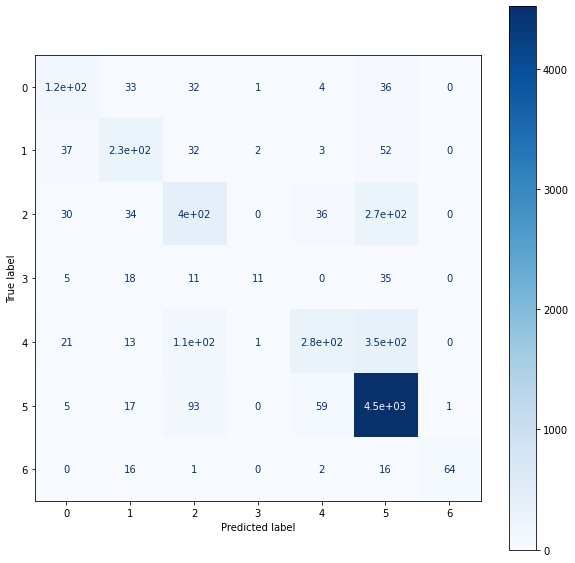


[[ 122   33   32    1    4   36    0]
 [  37  233   32    2    3   52    0]
 [  30   34  401    0   36  268    0]
 [   5   18   11   11    0   35    0]
 [  21   13  108    1  284  352    0]
 [   5   17   93    0   59 4518    1]
 [   0   16    1    0    2   16   64]]

Classification Report
              precision    recall  f1-score   support

           0       0.55      0.54      0.54       228
           1       0.64      0.65      0.64       359
           2       0.59      0.52      0.55       769
           3       0.73      0.14      0.23        80
           4       0.73      0.36      0.49       779
           5       0.86      0.96      0.91      4693
           6       0.98      0.65      0.78        99

    accuracy                           0.80      7007
   macro avg       0.73      0.55      0.59      7007
weighted avg       0.79      0.80      0.79      7007


Model evaluation on test dataset
Confusion Matrix



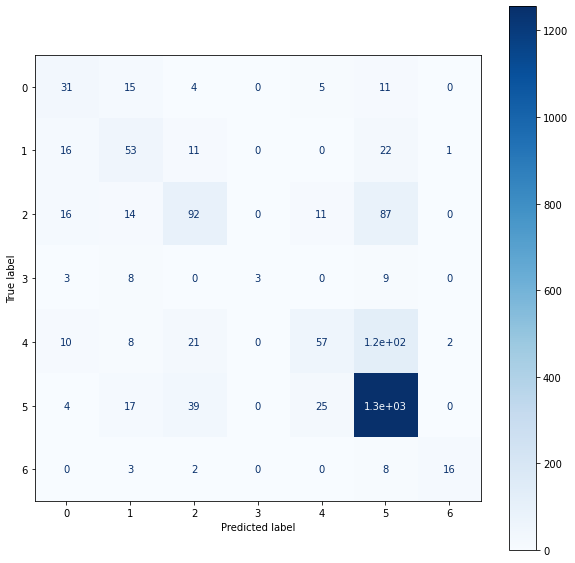


[[  31   15    4    0    5   11    0]
 [  16   53   11    0    0   22    1]
 [  16   14   92    0   11   87    0]
 [   3    8    0    3    0    9    0]
 [  10    8   21    0   57  125    2]
 [   4   17   39    0   25 1256    0]
 [   0    3    2    0    0    8   16]]

Classification Report
              precision    recall  f1-score   support

           0       0.39      0.47      0.42        66
           1       0.45      0.51      0.48       103
           2       0.54      0.42      0.47       220
           3       1.00      0.13      0.23        23
           4       0.58      0.26      0.36       223
           5       0.83      0.94      0.88      1341
           6       0.84      0.55      0.67        29

    accuracy                           0.75      2005
   macro avg       0.66      0.47      0.50      2005
weighted avg       0.74      0.75      0.73      2005



In [ ]:
print('Model evaluation on train dataset')
reportPerformance(model, x_train, y_train)
print()
print('Model evaluation on test dataset')
reportPerformance(model, x_test, y_test)

## Design CNN Model Based On Resnet Blocks

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_9 (InputLayer)            [(None, 28, 28, 3)]  0                                            
__________________________________________________________________________________________________
conv2d_107 (Conv2D)             (None, 28, 28, 32)   320         input_9[0][0]                    
__________________________________________________________________________________________________
conv2d_108 (Conv2D)             (None, 28, 28, 32)   3104        conv2d_107[0][0]                 
__________________________________________________________________________________________________
conv2d_109 (Conv2D)             (None, 28, 28, 32)   3104        conv2d_108[0][0]                 
____________________________________________________________________________________________

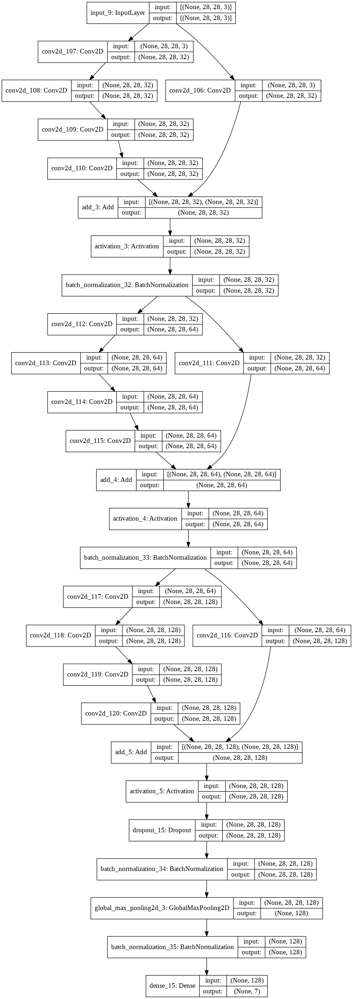

In [ ]:
if model:
  del model

  
# define model input
inputs = keras.Input(shape=x_train.shape[1:])
# add residual module
layer = residual_module(inputs, 32)
b = BatchNormalization()(layer)

layer = residual_module(b, 64)
b = BatchNormalization()(layer)

layer = residual_module(b, 128)
d0 = Dropout(0.2)(layer)
b = BatchNormalization()(d0)

# layer = residual_module(b, 256)
# b = BatchNormalization() (layer)
# create model
maxPooling = GlobalMaxPooling2D()(b)
b1 = BatchNormalization() (maxPooling)
outputs = Dense(7, activation='softmax')(b1)

model = keras.Model(inputs=inputs, outputs=outputs)
# summarize model
model.summary()
# plot model architecture
keras.utils.plot_model(model, show_shapes=True, to_file='residual_module.png')

In [ ]:
model.compile(
    loss=keras.losses.CategoricalCrossentropy(),
    # optimizer=keras.optimizers.SGD(learning_rate=0.1, nesterov=True),
    optimizer=keras.optimizers.Adam(),
    # optimizer=keras.optimizers.SGD(lr=0.001, momentum=0.9),
    # optimizer=keras.optimizers.RMSprop(),
    metrics=[
             'AUC', 
              tf.keras.metrics.CategoricalAccuracy()
             ],
              )

# fit the keras model on the dataset
my_callbacks = [
    EarlyStoppingCallback(25, monitor='val_loss'),
    keras.callbacks.ReduceLROnPlateau(monitor='val_loss', mode='auto',
                                      factor=0.9, patience=5, min_lr=1e-5)
]
history = model.fit(x_train, y_train, epochs=30, callbacks=my_callbacks,
                    batch_size=64,  validation_data=(x_val, y_val), shuffle=True)

Epoch 1/30
110/110 [==============================] - 7s 48ms/step - loss: 1.3723 - auc: 0.8295 - categorical_accuracy: 0.5620 - val_loss: 1.1085 - val_auc: 0.8837 - val_categorical_accuracy: 0.6700
Epoch 2/30
110/110 [==============================] - 5s 44ms/step - loss: 0.8319 - auc: 0.9453 - categorical_accuracy: 0.7126 - val_loss: 1.0029 - val_auc: 0.9177 - val_categorical_accuracy: 0.6710
Epoch 3/30
110/110 [==============================] - 5s 44ms/step - loss: 0.7512 - auc: 0.9533 - categorical_accuracy: 0.7306 - val_loss: 1.0052 - val_auc: 0.9299 - val_categorical_accuracy: 0.6810

wait mode, step: 1
Epoch 4/30
110/110 [==============================] - 5s 44ms/step - loss: 0.7204 - auc: 0.9566 - categorical_accuracy: 0.7353 - val_loss: 0.8408 - val_auc: 0.9486 - val_categorical_accuracy: 0.6839
Epoch 5/30
110/110 [==============================] - 5s 44ms/step - loss: 0.6913 - auc: 0.9601 - categorical_accuracy: 0.7431 - val_loss: 0.7698 - val_auc: 0.9507 - val_categorical_ac

Plot  accuracy and loss in epochs

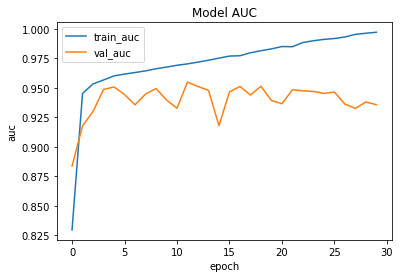

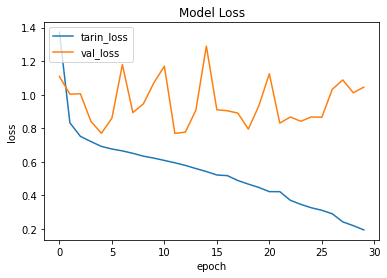

In [ ]:
  plotMetric(history, 'auc', 'train_auc', 'val_auc', 'val_auc', 'Model AUC', 'auc')
  print()
  plotMetric(history, 'loss', 'tarin_loss', 'val_loss', 'val_loss', 'Model Loss', 'loss')

Calculate the accuracy of model in train and test 

In [ ]:
calculateAccuracyModel(model, 'ResnetModel_BeforeBalancingDataset')

71/71 [==============================] - 2s 25ms/step - loss: 0.5379 - auc: 0.9797 - categorical_accuracy: 0.7886
Train Accuracy: 97.97

21/21 [==============================] - 1s 29ms/step - loss: 1.1067 - auc: 0.9349 - categorical_accuracy: 0.7222
Test Accuracy: 93.49


Evaluate the model performance

Model evaluation on train dataset
Confusion Matrix



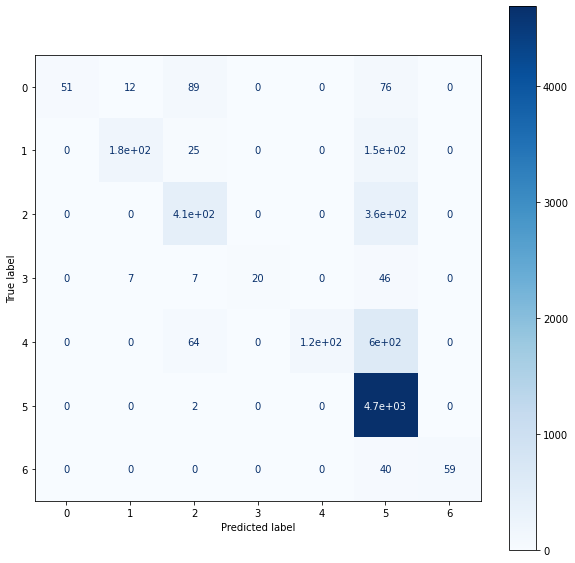


[[  51   12   89    0    0   76    0]
 [   0  184   25    0    0  150    0]
 [   0    0  406    0    0  363    0]
 [   0    7    7   20    0   46    0]
 [   0    0   64    0  115  600    0]
 [   0    0    2    0    0 4691    0]
 [   0    0    0    0    0   40   59]]

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.22      0.37       228
           1       0.91      0.51      0.65       359
           2       0.68      0.53      0.60       769
           3       1.00      0.25      0.40        80
           4       1.00      0.15      0.26       779
           5       0.79      1.00      0.88      4693
           6       1.00      0.60      0.75        99

    accuracy                           0.79      7007
   macro avg       0.91      0.47      0.56      7007
weighted avg       0.82      0.79      0.74      7007


Model evaluation on test dataset
Confusion Matrix



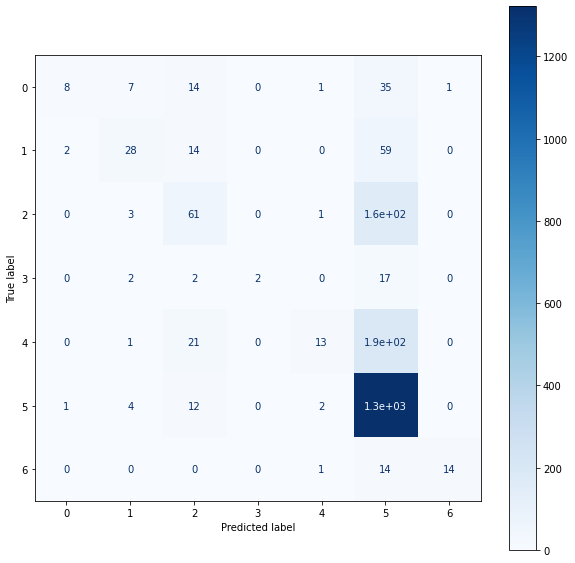


[[   8    7   14    0    1   35    1]
 [   2   28   14    0    0   59    0]
 [   0    3   61    0    1  155    0]
 [   0    2    2    2    0   17    0]
 [   0    1   21    0   13  188    0]
 [   1    4   12    0    2 1322    0]
 [   0    0    0    0    1   14   14]]

Classification Report
              precision    recall  f1-score   support

           0       0.73      0.12      0.21        66
           1       0.62      0.27      0.38       103
           2       0.49      0.28      0.35       220
           3       1.00      0.09      0.16        23
           4       0.72      0.06      0.11       223
           5       0.74      0.99      0.84      1341
           6       0.93      0.48      0.64        29

    accuracy                           0.72      2005
   macro avg       0.75      0.33      0.38      2005
weighted avg       0.71      0.72      0.65      2005



In [ ]:
print('Model evaluation on train dataset')
reportPerformance(model, x_train, y_train)
print()
print('Model evaluation on test dataset')
reportPerformance(model, x_test, y_test)

# Over Sampeling With Smote

Check the labels distribution

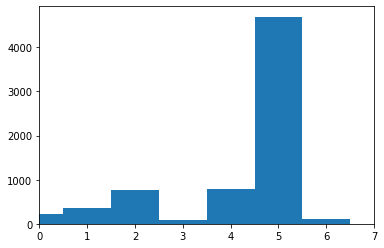

In [ ]:
hist, bin_edges = np.histogram(np.argmax(y_train, axis=1), bins=range(8))
plt.bar(bin_edges[:-1], hist, width = 1)
plt.xlim(min(bin_edges), max(bin_edges))
plt.show()   

In [ ]:

dim_one = x_train.shape[0]
dim_two = x_train.shape[1] * x_train.shape[2] * x_train.shape[3]
x_train_2d = x_train.reshape(dim_one,dim_two)

sm = SMOTE(random_state=42, sampling_strategy='auto', n_jobs=8)
X_smote, y_smote = sm.fit_resample(x_train_2d, y_train)
# sampling_strategy={0:10, 1:10, 2:10, 3:10, 4:10, 5:40, 6:10}
# over_smote = SMOTE(random_state=42)
# under_random = RandomUnderSampler(sampling_strategy='minority')

# steps = [('over', over_smote), ('under', under_random)]
# pipeline = Pipeline(steps=steps)

# X_smote, y_smote = pipeline.fit_resample(x_train_2d, y_train)


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarni

(32851, 2352)


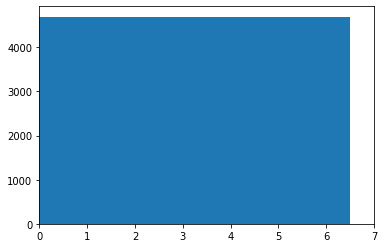

In [ ]:
print(X_smote.shape)
img_shape = x_train.shape
x_train = X_smote.reshape(X_smote.shape[0], img_shape[1], img_shape[2], img_shape[3])
y_train = y_smote
hist, bin_edges = np.histogram(np.argmax(y_smote, axis=1), bins=range(8))
plt.bar(bin_edges[:-1], hist, width = 1)
plt.xlim(min(bin_edges), max(bin_edges))
plt.show()   

# Design CNN Models After UpSampeling

## Design CNN Model Based On Inception Modules

CNN model with inception module 3

Model: "cifar10_cnn_model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_10 (InputLayer)           [(None, 28, 28, 3)]  0                                            
__________________________________________________________________________________________________
conv2d_121 (Conv2D)             (None, 22, 22, 32)   4736        input_10[0][0]                   
__________________________________________________________________________________________________
max_pooling2d_14 (MaxPooling2D) (None, 10, 10, 32)   0           conv2d_121[0][0]                 
__________________________________________________________________________________________________
batch_normalization_36 (BatchNo (None, 10, 10, 32)   128         max_pooling2d_14[0][0]           
__________________________________________________________________________________

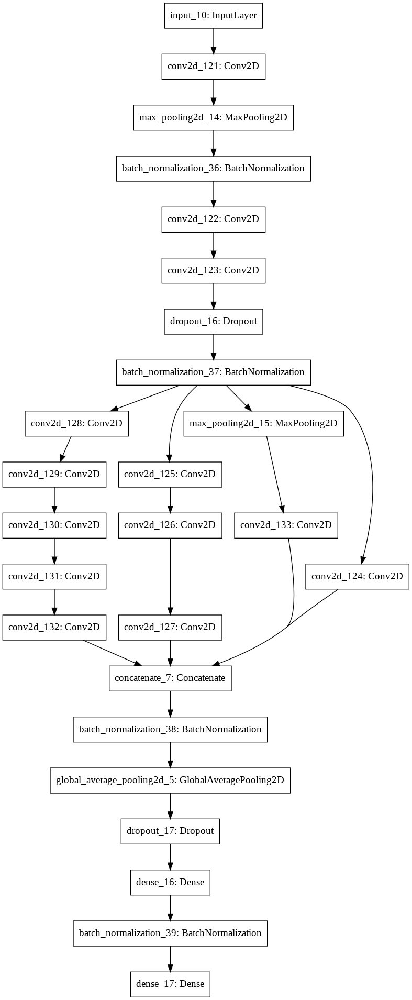

In [ ]:
if model:
  del model

inputs = keras.Input(shape=x_train.shape[1:])
conv1 = Conv2D(32, kernel_size=7, activation='relu')(inputs)
pool1 = MaxPooling2D(pool_size=3, strides=2)(conv1)
b1 = BatchNormalization() (pool1)
conv2 = Conv2D(64, kernel_size=(1, 3), activation='relu')(b1)
conv2 = Conv2D(64, kernel_size=(3, 1), activation='relu')(conv2)
d0 = Dropout(0.2)(conv2)
b2 = BatchNormalization() (d0)

layer = inception_module3(b2, 32, 48, 64, 8, 16, 16)
b3 = BatchNormalization() (layer)
globalPooling1 = GlobalAveragePooling2D()(b3)
d1 = Dropout(0.4)(globalPooling1)
fc1 = Dense(32, activation='linear')(d1)
b4 = BatchNormalization() (fc1)
outputs = Dense(7, activation='softmax')(b4)
model = keras.Model(inputs=inputs, outputs=outputs, name="cifar10_cnn_model")

model.summary()
keras.utils.plot_model(model, "my_first_cnn_model_with_shape_info.png")

Compile and train first cnn model

In [ ]:

model.compile(
    loss=keras.losses.CategoricalCrossentropy(),
    # optimizer=keras.optimizers.SGD(learning_rate=0.1, nesterov=True),
    optimizer=keras.optimizers.Adam(),
    # optimizer=keras.optimizers.SGD(lr=0.001, momentum=0.9),
    # optimizer=keras.optimizers.RMSprop(),
    metrics=[
             'AUC', 
              tf.keras.metrics.CategoricalAccuracy()
             ],
)

# fit the keras model on the dataset
my_callbacks = [
    EarlyStoppingCallback(25, monitor='val_loss'),
    keras.callbacks.ReduceLROnPlateau(monitor='val_loss', mode='auto',
                                      factor=0.9, patience=5, min_lr=1e-5)
]
history = model.fit(x_train, y_train, epochs=100, callbacks=my_callbacks,
                    batch_size=64,  validation_data=(x_val, y_val), shuffle=True)

Epoch 1/100
514/514 [==============================] - 6s 10ms/step - loss: 1.0985 - auc: 0.8982 - categorical_accuracy: 0.5891 - val_loss: 1.7899 - val_auc: 0.7616 - val_categorical_accuracy: 0.4447
Epoch 2/100
514/514 [==============================] - 4s 9ms/step - loss: 0.7540 - auc: 0.9523 - categorical_accuracy: 0.7225 - val_loss: 1.5265 - val_auc: 0.8536 - val_categorical_accuracy: 0.4576
Epoch 3/100
514/514 [==============================] - 5s 9ms/step - loss: 0.6294 - auc: 0.9661 - categorical_accuracy: 0.7716 - val_loss: 2.3239 - val_auc: 0.7341 - val_categorical_accuracy: 0.3519

wait mode, step: 1
Epoch 4/100
514/514 [==============================] - 5s 9ms/step - loss: 0.5464 - auc: 0.9742 - categorical_accuracy: 0.8023 - val_loss: 1.1743 - val_auc: 0.9111 - val_categorical_accuracy: 0.5743
Epoch 5/100
514/514 [==============================] - 5s 9ms/step - loss: 0.4846 - auc: 0.9794 - categorical_accuracy: 0.8236 - val_loss: 1.1425 - val_auc: 0.9050 - val_categorical_a

Plot  accuracy and loss in epochs

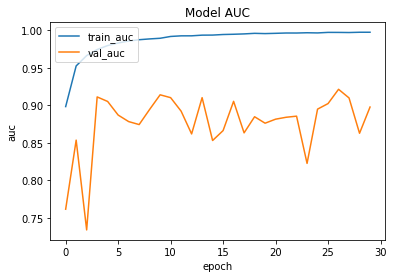

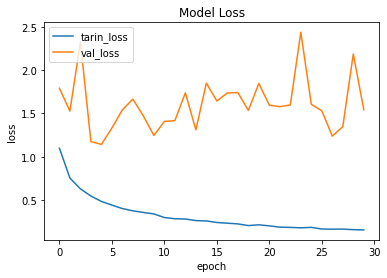

In [ ]:
  plotMetric(history, 'auc', 'train_auc', 'val_auc', 'val_auc', 'Model AUC', 'auc')
  print()
  plotMetric(history, 'loss', 'tarin_loss', 'val_loss', 'val_loss', 'Model Loss', 'loss')

Calculate the accuracy of model in train and test 

In [ ]:
calculateAccuracyModel(model, 'CNN_Inception_V3_AfterBalancingDataset')

329/329 [==============================] - 2s 6ms/step - loss: 1.7325 - auc: 0.8336 - categorical_accuracy: 0.5213
Train Accuracy: 83.36

21/21 [==============================] - 0s 5ms/step - loss: 1.1539 - auc: 0.9068 - categorical_accuracy: 0.5791
Test Accuracy: 90.68


Evaluate the model performance

Model evaluation on train dataset
Confusion Matrix



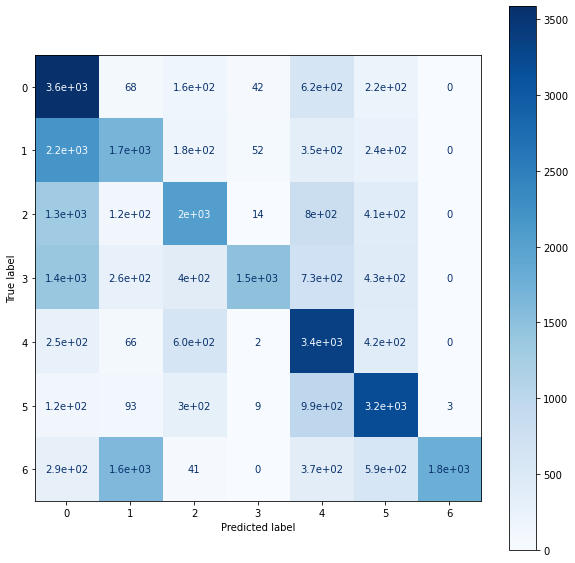


[[3587   68  162   42  616  218    0]
 [2176 1695  178   52  353  239    0]
 [1310  122 2037   14  796  414    0]
 [1396  260  403 1481  726  427    0]
 [ 254   66  605    2 3350  416    0]
 [ 121   93  296    9  986 3185    3]
 [ 292 1613   41    0  371  586 1790]]

Classification Report
              precision    recall  f1-score   support

           0       0.39      0.76      0.52      4693
           1       0.43      0.36      0.39      4693
           2       0.55      0.43      0.48      4693
           3       0.93      0.32      0.47      4693
           4       0.47      0.71      0.56      4693
           5       0.58      0.68      0.63      4693
           6       1.00      0.38      0.55      4693

    accuracy                           0.52     32851
   macro avg       0.62      0.52      0.52     32851
weighted avg       0.62      0.52      0.52     32851


Model evaluation on test dataset
Confusion Matrix



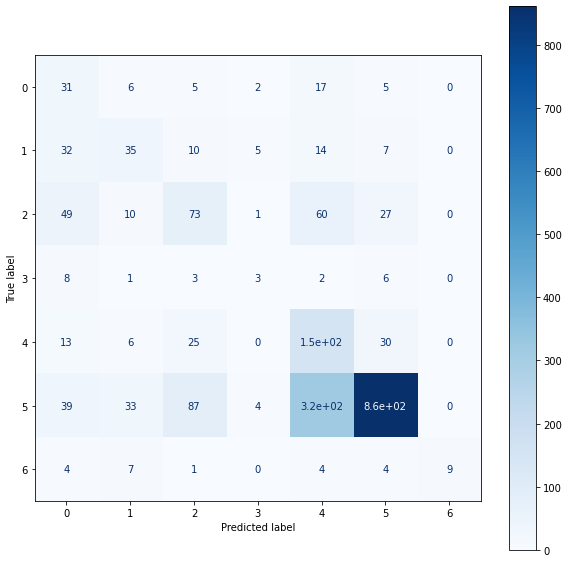


[[ 31   6   5   2  17   5   0]
 [ 32  35  10   5  14   7   0]
 [ 49  10  73   1  60  27   0]
 [  8   1   3   3   2   6   0]
 [ 13   6  25   0 149  30   0]
 [ 39  33  87   4 317 861   0]
 [  4   7   1   0   4   4   9]]

Classification Report
              precision    recall  f1-score   support

           0       0.18      0.47      0.26        66
           1       0.36      0.34      0.35       103
           2       0.36      0.33      0.34       220
           3       0.20      0.13      0.16        23
           4       0.26      0.67      0.38       223
           5       0.92      0.64      0.75      1341
           6       1.00      0.31      0.47        29

    accuracy                           0.58      2005
   macro avg       0.47      0.41      0.39      2005
weighted avg       0.72      0.58      0.62      2005



In [ ]:
print('Model evaluation on train dataset')
reportPerformance(model, x_train, y_train)
print()
print('Model evaluation on test dataset')
reportPerformance(model, x_test, y_test)

## Design CNN Model Based On Resnet Blocks

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_11 (InputLayer)           [(None, 28, 28, 3)]  0                                            
__________________________________________________________________________________________________
conv2d_135 (Conv2D)             (None, 28, 28, 32)   320         input_11[0][0]                   
__________________________________________________________________________________________________
conv2d_136 (Conv2D)             (None, 28, 28, 32)   3104        conv2d_135[0][0]                 
__________________________________________________________________________________________________
conv2d_137 (Conv2D)             (None, 28, 28, 32)   3104        conv2d_136[0][0]                 
____________________________________________________________________________________________

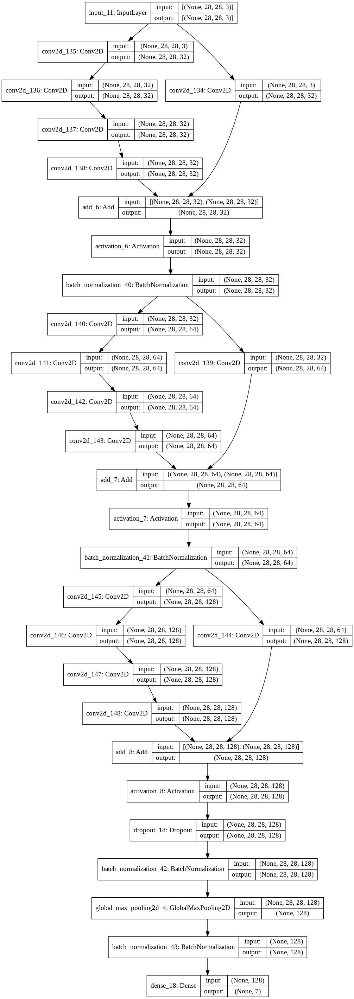

In [ ]:
if model:
  del model

# define model input
inputs = keras.Input(shape=x_train.shape[1:])
# add residual module
layer = residual_module(inputs, 32)
b = BatchNormalization()(layer)

layer = residual_module(b, 64)
b = BatchNormalization()(layer)

layer = residual_module(b, 128)
d0 = Dropout(0.2)(layer)
b = BatchNormalization()(d0)

# layer = residual_module(b, 256)
# b = BatchNormalization() (layer)
# create model
maxPooling = GlobalMaxPooling2D()(b)
b1 = BatchNormalization() (maxPooling)
outputs = Dense(7, activation='softmax')(b1)

model = keras.Model(inputs=inputs, outputs=outputs)
# summarize model
model.summary()
# plot model architecture
keras.utils.plot_model(model, show_shapes=True, to_file='residual_module.png')

In [ ]:
model.compile(
    loss=keras.losses.CategoricalCrossentropy(),
    # optimizer=keras.optimizers.SGD(learning_rate=0.1, nesterov=True),
    optimizer=keras.optimizers.Adam(),
    # optimizer=keras.optimizers.SGD(lr=0.001, momentum=0.9),
    # optimizer=keras.optimizers.RMSprop(),
    metrics=[
             'AUC', 
              tf.keras.metrics.CategoricalAccuracy()
             ],
              )

# fit the keras model on the dataset
my_callbacks = [
    EarlyStoppingCallback(25, monitor='val_loss'),
    keras.callbacks.ReduceLROnPlateau(monitor='val_loss', mode='auto',
                                      factor=0.9, patience=5, min_lr=1e-5)
]
history = model.fit(x_train, y_train, epochs=100, callbacks=my_callbacks,
                    batch_size=64,  validation_data=(x_val, y_val), shuffle=True)

Epoch 1/100
430/514 [========================>.....] - ETA: 3s - loss: 0.9606 - auc: 0.9228 - categorical_accuracy: 0.6534

KeyboardInterrupt: ignored

Plot  accuracy and loss in epochs

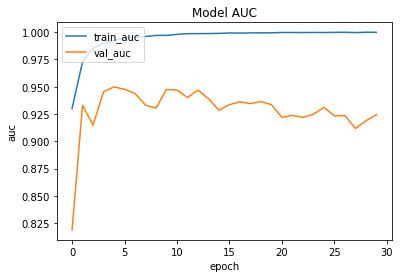

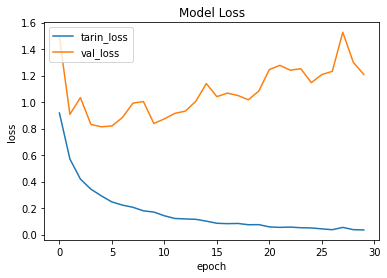

In [ ]:
  plotMetric(history, 'auc', 'train_auc', 'val_auc', 'val_auc', 'Model AUC', 'auc')
  print()
  plotMetric(history, 'loss', 'tarin_loss', 'val_loss', 'val_loss', 'Model Loss', 'loss')

Calculate the accuracy of model in train and test 

In [ ]:
calculateAccuracyModel(model, 'ResnetModel_AfterBalancingDataset')

329/329 [==============================] - 8s 23ms/step - loss: 0.5420 - auc: 0.9747 - categorical_accuracy: 0.7896
Train Accuracy: 97.47

21/21 [==============================] - 0s 21ms/step - loss: 0.8496 - auc: 0.9464 - categorical_accuracy: 0.7137
Test Accuracy: 94.64


Evaluate the model performance

Model evaluation on train dataset
Confusion Matrix



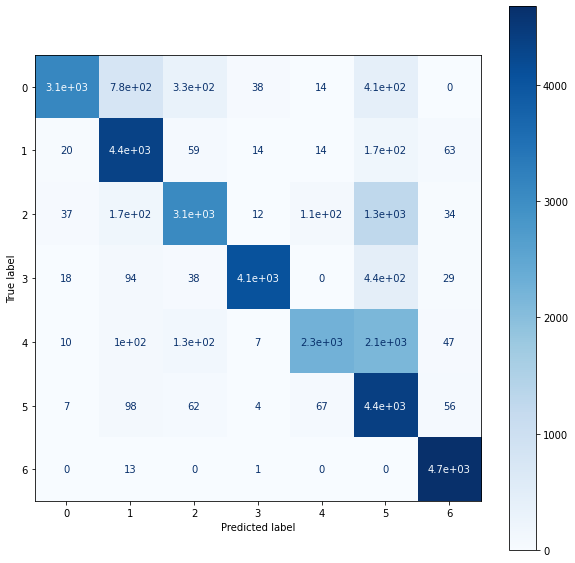


[[3121  780  328   38   14  412    0]
 [  20 4350   59   14   14  173   63]
 [  37  174 3066   12  107 1263   34]
 [  18   94   38 4072    0  442   29]
 [  10  103  133    7 2251 2142   47]
 [   7   98   62    4   67 4399   56]
 [   0   13    0    1    0    0 4679]]

Classification Report
              precision    recall  f1-score   support

           0       0.97      0.67      0.79      4693
           1       0.78      0.93      0.84      4693
           2       0.83      0.65      0.73      4693
           3       0.98      0.87      0.92      4693
           4       0.92      0.48      0.63      4693
           5       0.50      0.94      0.65      4693
           6       0.95      1.00      0.97      4693

    accuracy                           0.79     32851
   macro avg       0.85      0.79      0.79     32851
weighted avg       0.85      0.79      0.79     32851


Model evaluation on test dataset
Confusion Matrix



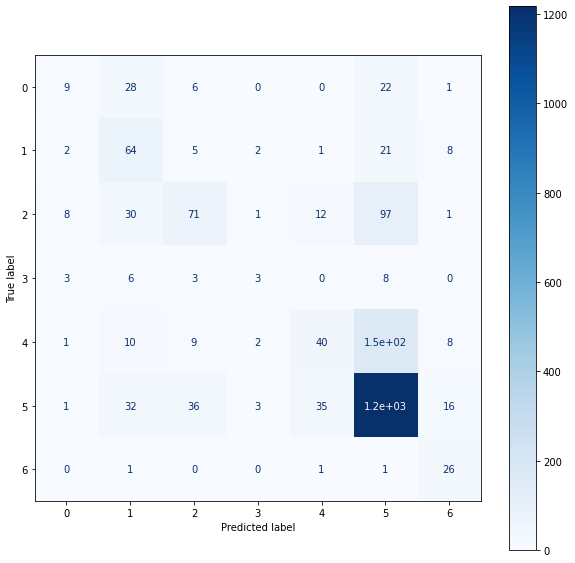


[[   9   28    6    0    0   22    1]
 [   2   64    5    2    1   21    8]
 [   8   30   71    1   12   97    1]
 [   3    6    3    3    0    8    0]
 [   1   10    9    2   40  153    8]
 [   1   32   36    3   35 1218   16]
 [   0    1    0    0    1    1   26]]

Classification Report
              precision    recall  f1-score   support

           0       0.38      0.14      0.20        66
           1       0.37      0.62      0.47       103
           2       0.55      0.32      0.41       220
           3       0.27      0.13      0.18        23
           4       0.45      0.18      0.26       223
           5       0.80      0.91      0.85      1341
           6       0.43      0.90      0.58        29

    accuracy                           0.71      2005
   macro avg       0.46      0.46      0.42      2005
weighted avg       0.69      0.71      0.68      2005



In [ ]:
print('Model evaluation on train dataset')
reportPerformance(model, x_train, y_train)
print()
print('Model evaluation on test dataset')
reportPerformance(model, x_test, y_test)

# ImageDataGenerator

Data Generator for Train Data set

In [ ]:
datagen_train = ImageDataGenerator(
    rotation_range=10,
    zoom_range=0.2,
    fill_mode='nearest',
    horizontal_flip=True,
)

datagen_train.fit(x_train)
train_gen = datagen_train.flow(x_train, y_train, batch_size=64, shuffle=True)


Data Generator for Validation Data set

In [ ]:
datagen_val = ImageDataGenerator(
    rotation_range=10,
    zoom_range=0.2,
    fill_mode='nearest',
    horizontal_flip=True,
)

datagen_val.fit(x_val)
val_gen = datagen_val.flow(x_val, y_val, batch_size=64, shuffle=True)

# CNN Models With Augmentation Data


## CNN Model Based On Inception Module

In [ ]:
if model:
  del model
  
inputs = keras.Input(shape=x_train.shape[1:])
conv1 = Conv2D(32, kernel_size=7, activation='relu')(inputs)
pool1 = MaxPooling2D(pool_size=3, strides=2)(conv1)
b1 = BatchNormalization() (pool1)
conv2 = Conv2D(64, kernel_size=(1, 3), activation='relu')(b1)
conv2 = Conv2D(64, kernel_size=(3, 1), activation='relu')(conv2)
d0 = Dropout(0.2)(conv2)
b2 = BatchNormalization() (d0)

layer = inception_module3(b2, 32, 48, 64, 8, 16, 16)
b3 = BatchNormalization() (layer)
globalPooling1 = GlobalAveragePooling2D()(b3)
d1 = Dropout(0.4)(globalPooling1)
fc1 = Dense(32, activation='linear')(d1)
b4 = BatchNormalization() (fc1)
outputs = Dense(7, activation='softmax')(b4)
model = keras.Model(inputs=inputs, outputs=outputs, name="cifar10_cnn_model")

model.summary()
# keras.utils.plot_model(model, "my_first_cnn_model_with_shape_info.png")

Model: "cifar10_cnn_model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_12 (InputLayer)           [(None, 28, 28, 3)]  0                                            
__________________________________________________________________________________________________
conv2d_149 (Conv2D)             (None, 22, 22, 32)   4736        input_12[0][0]                   
__________________________________________________________________________________________________
max_pooling2d_16 (MaxPooling2D) (None, 10, 10, 32)   0           conv2d_149[0][0]                 
__________________________________________________________________________________________________
batch_normalization_44 (BatchNo (None, 10, 10, 32)   128         max_pooling2d_16[0][0]           
__________________________________________________________________________________

In [ ]:
model.compile(
    loss=keras.losses.CategoricalCrossentropy(),
    # loss='mean_squared_error',
    # optimizer=keras.optimizers.SGD(learning_rate=0.1, nesterov=True),
    optimizer=keras.optimizers.Adam(),
    # optimizer=keras.optimizers.SGD(lr=0.001, momentum=0.9),
    # optimizer=keras.optimizers.RMSprop(),
    metrics=[
             'AUC',
        #     tf.keras.metrics.AUC(
        #     num_thresholds=200,
        #     curve="ROC",
        #     summation_method="interpolation",
        #     name=None,
        #     dtype=None,
        #     thresholds=None,
        #     multi_label=False,
        #     num_labels=None,
        #     label_weights=None,
        #     from_logits=False,
        # ),
             tf.keras.metrics.CategoricalAccuracy()
             ],
)

log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
# fit the keras model on the dataset
my_callbacks = [
    EarlyStoppingCallback(25, monitor='val_loss'),
    keras.callbacks.ReduceLROnPlateau(monitor='val_loss', mode='auto',
                                      factor=0.9, patience=5, min_lr=1e-5),
    tensorboard_callback,
]

batch_size=64
history = model.fit(train_gen, 
                    steps_per_epoch=train_gen.n // batch_size,
                    epochs=100, callbacks=my_callbacks,
                    # batch_size=64, 
                    validation_data=val_gen,
                    # class_weight=weights,
                    use_multiprocessing=True,
                    workers=8,
                    validation_steps=val_gen.n // batch_size,
                    shuffle=True)

Epoch 1/100
513/513 [==============================] - 19s 33ms/step - loss: 1.1763 - auc: 0.8828 - categorical_accuracy: 0.5560 - val_loss: 1.5705 - val_auc: 0.8327 - val_categorical_accuracy: 0.4927
Epoch 2/100
513/513 [==============================] - 18s 33ms/step - loss: 0.8695 - auc: 0.9369 - categorical_accuracy: 0.6783 - val_loss: 1.7327 - val_auc: 0.8565 - val_categorical_accuracy: 0.5583

wait mode, step: 1
Epoch 3/100
513/513 [==============================] - 16s 30ms/step - loss: 0.7628 - auc: 0.9510 - categorical_accuracy: 0.7195 - val_loss: 1.9413 - val_auc: 0.8262 - val_categorical_accuracy: 0.4750

wait mode, step: 2
Epoch 4/100
513/513 [==============================] - 16s 30ms/step - loss: 0.6837 - auc: 0.9604 - categorical_accuracy: 0.7470 - val_loss: 1.4581 - val_auc: 0.8632 - val_categorical_accuracy: 0.5073
Epoch 5/100
513/513 [==============================] - 16s 31ms/step - loss: 0.6334 - auc: 0.9658 - categorical_accuracy: 0.7661 - val_loss: 1.5104 - val_au

In [ ]:
%tensorboard --logdir logs/fit

<IPython.core.display.Javascript object>

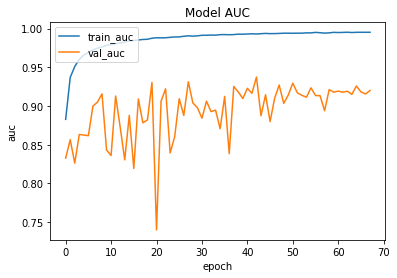

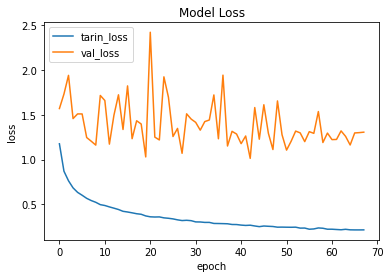

In [ ]:
  plotMetric(history, 'auc', 'train_auc', 'val_auc', 'val_auc', 'Model AUC', 'auc')
  print()
  plotMetric(history, 'loss', 'tarin_loss', 'val_loss', 'val_loss', 'Model Loss', 'loss')

In [ ]:
calculateAccuracyModel(model, 'CNN_Inception_V3_Data_Augmented')

329/329 [==============================] - 2s 6ms/step - loss: 0.4981 - auc: 0.9766 - categorical_accuracy: 0.8377
Train Accuracy: 97.66

21/21 [==============================] - 0s 6ms/step - loss: 0.9658 - auc: 0.9398 - categorical_accuracy: 0.7022
Test Accuracy: 93.98


Model evaluation on train dataset
Confusion Matrix



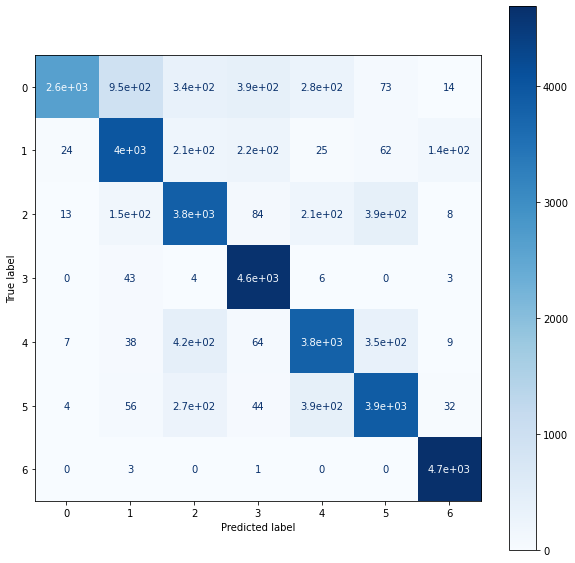


[[2637  952  344  388  285   73   14]
 [  24 4010  207  224   25   62  141]
 [  13  150 3844   84  208  386    8]
 [   0   43    4 4637    6    0    3]
 [   7   38  419   64 3809  347    9]
 [   4   56  271   44  392 3894   32]
 [   0    3    0    1    0    0 4689]]

Classification Report
              precision    recall  f1-score   support

           0       0.98      0.56      0.71      4693
           1       0.76      0.85      0.81      4693
           2       0.76      0.82      0.79      4693
           3       0.85      0.99      0.92      4693
           4       0.81      0.81      0.81      4693
           5       0.82      0.83      0.82      4693
           6       0.96      1.00      0.98      4693

    accuracy                           0.84     32851
   macro avg       0.85      0.84      0.83     32851
weighted avg       0.85      0.84      0.83     32851


Model evaluation on test dataset
Confusion Matrix



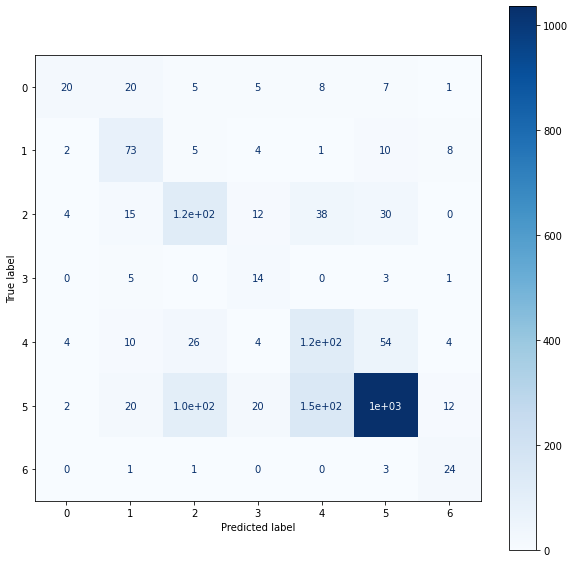


[[  20   20    5    5    8    7    1]
 [   2   73    5    4    1   10    8]
 [   4   15  121   12   38   30    0]
 [   0    5    0   14    0    3    1]
 [   4   10   26    4  121   54    4]
 [   2   20  105   20  147 1035   12]
 [   0    1    1    0    0    3   24]]

Classification Report
              precision    recall  f1-score   support

           0       0.62      0.30      0.41        66
           1       0.51      0.71      0.59       103
           2       0.46      0.55      0.50       220
           3       0.24      0.61      0.34        23
           4       0.38      0.54      0.45       223
           5       0.91      0.77      0.83      1341
           6       0.48      0.83      0.61        29

    accuracy                           0.70      2005
   macro avg       0.51      0.62      0.53      2005
weighted avg       0.76      0.70      0.72      2005



In [ ]:
print('Model evaluation on train dataset')
reportPerformance(model, x_train, y_train)
print()
print('Model evaluation on test dataset')
reportPerformance(model, x_test, y_test)

## CNN Model Based On Resnet Blocks

In [ ]:
if model:
  del model

# define model input
inputs = keras.Input(shape=x_train.shape[1:])
# add residual module
layer = residual_module(inputs, 32)
b = BatchNormalization()(layer)

layer = residual_module(b, 64)
b = BatchNormalization()(layer)

layer = residual_module(b, 128)
d0 = Dropout(0.2)(layer)
b = BatchNormalization()(d0)

# layer = residual_module(b, 256)
# b = BatchNormalization() (layer)
# create model
maxPooling = GlobalMaxPooling2D()(b)
b1 = BatchNormalization() (maxPooling)
outputs = Dense(7, activation='softmax')(b1)

model = keras.Model(inputs=inputs, outputs=outputs)
# summarize model
model.summary()
# plot model architecture
# keras.utils.plot_model(model, show_shapes=True, to_file='residual_module.png')

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_13 (InputLayer)           [(None, 28, 28, 3)]  0                                            
__________________________________________________________________________________________________
conv2d_163 (Conv2D)             (None, 28, 28, 32)   320         input_13[0][0]                   
__________________________________________________________________________________________________
conv2d_164 (Conv2D)             (None, 28, 28, 32)   3104        conv2d_163[0][0]                 
__________________________________________________________________________________________________
conv2d_165 (Conv2D)             (None, 28, 28, 32)   3104        conv2d_164[0][0]                 
____________________________________________________________________________________________

In [ ]:
model.compile(
    loss=keras.losses.CategoricalCrossentropy(),
    # loss='mean_squared_error',
    # optimizer=keras.optimizers.SGD(learning_rate=0.1, nesterov=True),
    optimizer=keras.optimizers.Adam(),
    # optimizer=keras.optimizers.SGD(lr=0.001, momentum=0.9),
    # optimizer=keras.optimizers.RMSprop(),
    metrics=[
             'AUC',
        #     tf.keras.metrics.AUC(
        #     num_thresholds=200,
        #     curve="ROC",
        #     summation_method="interpolation",
        #     name=None,
        #     dtype=None,
        #     thresholds=None,
        #     multi_label=False,
        #     num_labels=None,
        #     label_weights=None,
        #     from_logits=False,
        # ),
             tf.keras.metrics.CategoricalAccuracy()
             ],
)

log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
# fit the keras model on the dataset
my_callbacks = [
    EarlyStoppingCallback(25, monitor='val_loss'),
    keras.callbacks.ReduceLROnPlateau(monitor='val_loss', mode='auto',
                                      factor=0.9, patience=5, min_lr=1e-5),
    tensorboard_callback,
]

batch_size=64
history = model.fit(train_gen, 
                    steps_per_epoch=train_gen.n // batch_size,
                    epochs=100, callbacks=my_callbacks,
                    # batch_size=64, 
                    validation_data=val_gen,
                    # class_weight=weights,
                    use_multiprocessing=True,
                    workers=8,
                    validation_steps=val_gen.n // batch_size,
                    shuffle=True)

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 1/100
513/513 [==============================] - 31s 56ms/step - loss: 1.1013 - auc: 0.8973 - categorical_accuracy: 0.5879 - val_loss: 1.7957 - val_auc: 0.7615 - val_categorical_accuracy: 0.2542
Epoch 2/100
513/513 [==============================] - 26s 50ms/step - loss: 0.7660 - auc: 0.9508 - categorical_accuracy: 0.7237 - val_loss: 1.0989 - val_auc: 0.9009 - val_categorical_accuracy: 0.5969
Epoch 3/100
513/513 [==============================] - 26s 50ms/step - loss: 0.6506 - auc: 0.9642 - categorical_accuracy: 0.7610 - val_loss: 0.9846 - val_auc: 0.9191 - val_categorical_accuracy: 0.6292
Epoch 4/100
513/513 [==============================] - 27s 52ms/step - loss: 0.5789 - auc: 0.9713 - categorical_accuracy: 0.7917 - val_loss: 0.9069 - val_auc: 0.9323 - val_categorical_accuracy: 0.6438
Epoch 5/100
513/513 [==============================] - 26s 50ms/step - loss: 0.5236 - auc: 0.9765 - categorical_accuracy: 0.8103 - val_loss: 0.9911 - val_auc: 0.9238 - val_categorical_accuracy: 0.

Plot  accuracy and loss in epochs

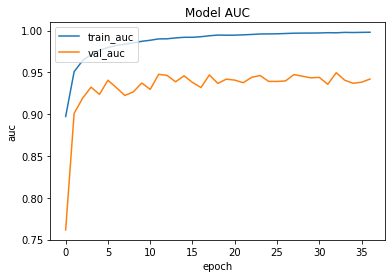

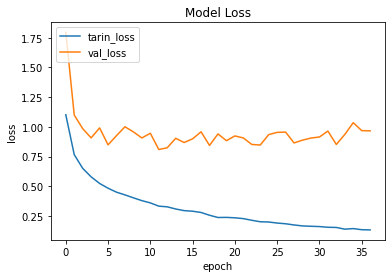

In [ ]:
  plotMetric(history, 'auc', 'train_auc', 'val_auc', 'val_auc', 'Model AUC', 'auc')
  print()
  plotMetric(history, 'loss', 'tarin_loss', 'val_loss', 'val_loss', 'Model Loss', 'loss')

Calculate the accuracy of model in train and test 

In [ ]:
calculateAccuracyModel(model, 'ResnetModel_Data_Augmented')

329/329 [==============================] - 8s 23ms/step - loss: 0.5267 - auc: 0.9761 - categorical_accuracy: 0.7958
Train Accuracy: 97.61

21/21 [==============================] - 1s 22ms/step - loss: 0.7626 - auc: 0.9531 - categorical_accuracy: 0.7052
Test Accuracy: 95.31


Evaluate the model performance

Model evaluation on train dataset
Confusion Matrix



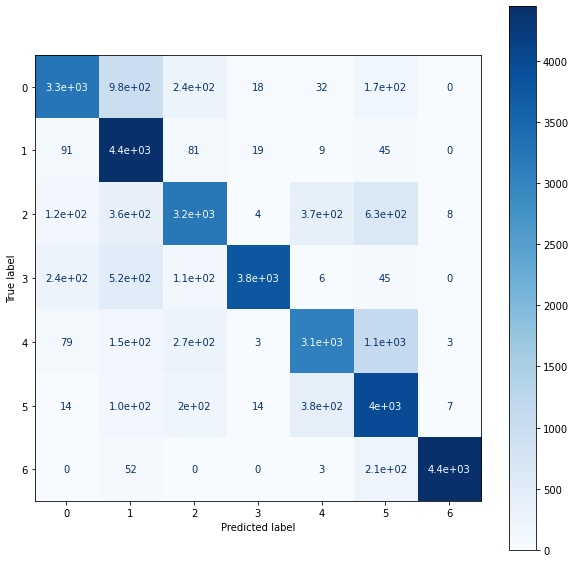


[[3255  979  243   18   32  166    0]
 [  91 4448   81   19    9   45    0]
 [ 124  359 3201    4  366  631    8]
 [ 245  518  107 3772    6   45    0]
 [  79  147  271    3 3070 1120    3]
 [  14  105  201   14  383 3969    7]
 [   0   52    0    0    3  210 4428]]

Classification Report
              precision    recall  f1-score   support

           0       0.85      0.69      0.77      4693
           1       0.67      0.95      0.79      4693
           2       0.78      0.68      0.73      4693
           3       0.98      0.80      0.89      4693
           4       0.79      0.65      0.72      4693
           5       0.64      0.85      0.73      4693
           6       1.00      0.94      0.97      4693

    accuracy                           0.80     32851
   macro avg       0.82      0.80      0.80     32851
weighted avg       0.82      0.80      0.80     32851


Model evaluation on test dataset
Confusion Matrix



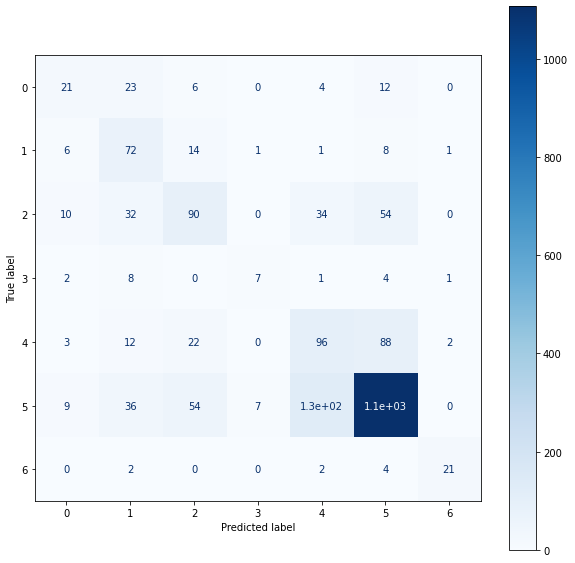


[[  21   23    6    0    4   12    0]
 [   6   72   14    1    1    8    1]
 [  10   32   90    0   34   54    0]
 [   2    8    0    7    1    4    1]
 [   3   12   22    0   96   88    2]
 [   9   36   54    7  128 1107    0]
 [   0    2    0    0    2    4   21]]

Classification Report
              precision    recall  f1-score   support

           0       0.41      0.32      0.36        66
           1       0.39      0.70      0.50       103
           2       0.48      0.41      0.44       220
           3       0.47      0.30      0.37        23
           4       0.36      0.43      0.39       223
           5       0.87      0.83      0.85      1341
           6       0.84      0.72      0.78        29

    accuracy                           0.71      2005
   macro avg       0.55      0.53      0.53      2005
weighted avg       0.72      0.71      0.71      2005



In [ ]:
print('Model evaluation on train dataset')
reportPerformance(model, x_train, y_train)
print()
print('Model evaluation on test dataset')
reportPerformance(model, x_test, y_test)

# Final Results

In [ ]:
from tabulate import tabulate
import pandas as pd

all_metrics = pd.DataFrame(all_accuracy).T

all_metrics.columns = [
                       'Train Weighted Accuracy', 
                       'Train AUC',
                       'Test Weighted Accuracy', 
                       'Test AUC',
                        ]
print(tabulate(all_metrics, headers='keys', tablefmt='psql'))

+-------------------------------------------------------+---------------------------+-------------+--------------------------+------------+
|                                                       |   Train Weighted Accuracy |   Train AUC |   Test Weighted Accuracy |   Test AUC |
|-------------------------------------------------------+---------------------------+-------------+--------------------------+------------|
| CNN_Inception_BeforeBalancingDataset                  |                   83.3452 |     98.1874 |                  74.015  |    95.2876 |
| CNN_Inception_BeforeBalancingDataset_Sigmoid          |                   36.6776 |     75.5511 |                  36.6085 |    75.326  |
| CNN_Inception_BeforeBalancingDataset_Tanh             |                   43.7705 |     82.9079 |                  43.591  |    82.9845 |
| CNN_Inception_BeforeBalancingDataset_GlobalMaxPooling |                   80.391  |     97.6904 |                  75.212  |    96.0508 |
| ResnetModel_Before